# Capstone pipeline: livestock detection, counting and classification

Author: Meerim Zhenishbekova

This is the working pipeline for my MSc capstone. The goal is to compare a few computer vision approaches on a livestock dataset (cattle and sheep) and see how they trade off on classification, detection and counting.

The data comes from two places. WAID is a Roboflow YOLO dataset with farm animals already annotated. From COCO 2017 I pull a smaller subset of cow and sheep images using FiftyOne, so the model also sees more general-domain photos. After cleaning I keep only cattle and sheep and drop the WAID classes I do not need (camelus, kiang, seal, zebra).

The pipeline runs in seven phases inside the same notebook: setup and data download, EDA, preprocessing into a YOLO layout plus single-animal crops, a custom CNN trained from scratch, transfer learning with ResNet50, VGG16 and MobileNetV2 (feature extraction only), a YOLOv8n detector for counting, and a final comparison with hypothesis tests.

Stack: PyTorch, torchvision, Ultralytics YOLOv8, Optuna for hyperparameter search, OpenCV and PIL for image work, scikit-learn and statsmodels for metrics and McNemar test, matplotlib and seaborn for plots. Training runs on Apple MPS locally and falls back to CPU or CUDA on Kaggle. Random seed is fixed at 42 everywhere I could fix it.

## Phase 1: setup and data download

I start with the setup. Imports, paths, seeds. Then I pull the two source datasets: WAID (already on disk) and a COCO 2017 cow/sheep subset via FiftyOne. At the end I print a quick sanity check on splits and class lists, just to confirm the files actually landed where I expected.

I set the random seed and resolve the project root. The notebook can be run from `notebooks/` or from the project root, so I handle both. `data/raw` is created if it does not exist.

In [1]:
from pathlib import Path
import random

import numpy as np
import yaml

SEED = 42
random.seed(SEED)
np.random.seed(SEED)

PROJECT_ROOT = Path.cwd()
if PROJECT_ROOT.name == "notebooks":
    PROJECT_ROOT = PROJECT_ROOT.parent

DATA_RAW = PROJECT_ROOT / "data" / "raw"
DATA_RAW.mkdir(parents=True, exist_ok=True)

print("project root:", PROJECT_ROOT)
print("raw data dir:", DATA_RAW)

project root: /Users/m/Documents/capstone-msc-da-feb-25-cohort-MeerimZhenisbekova
raw data dir: /Users/m/Documents/capstone-msc-da-feb-25-cohort-MeerimZhenisbekova/data/raw


I check that the WAID folder is in place and load its `data.yaml` to get the class names. Then I count the images per split. If WAID is missing the assert will fail loudly so I know to download it.

In [2]:
WAID_DIR = DATA_RAW / "waid"
assert WAID_DIR.exists(), f"WAID folder not found at {WAID_DIR}"

waid_yaml = next(WAID_DIR.rglob("data.yaml"), None)
assert waid_yaml is not None, "data.yaml not found under the WAID folder"

with open(waid_yaml) as f:
    waid_meta = yaml.safe_load(f)

print("WAID data.yaml:", waid_yaml)
print("WAID class names:", waid_meta["names"])

waid_root = waid_yaml.parent
for split in ("train", "valid", "test"):
    imgs_dir = waid_root / split / "images"
    n = len(list(imgs_dir.glob("*.jpg"))) if imgs_dir.exists() else 0
    print(f"  {split}: {n} images")

WAID data.yaml: /Users/m/Documents/capstone-msc-da-feb-25-cohort-MeerimZhenisbekova/data/raw/waid/data.yaml
WAID class names: ['camelus', 'cattle', 'kiang', 'seal', 'sheep', 'zebra']
  train: 10056 images
  valid: 2873 images
  test: 1437 images


I pull a cow/sheep subset of COCO 2017 through FiftyOne and export it in YOLO format. I cap the sample at 3500 to keep things manageable. If the export folder already exists I skip the download.

In [3]:
import fiftyone as fo
import fiftyone.zoo as foz

COCO_DIR = DATA_RAW / "coco_cow_sheep"
COCO_DIR.mkdir(parents=True, exist_ok=True)

coco_exported = COCO_DIR / "exported"

if not coco_exported.exists():
    ds = foz.load_zoo_dataset(
        "coco-2017",
        split="train",
        label_types=["detections"],
        classes=["cow", "sheep"],
        max_samples=3500,
        shuffle=True,
        seed=SEED,
        dataset_name="coco_cow_sheep_clean",
        drop_existing_dataset=True,
    )
    ds.export(
        export_dir=str(coco_exported),
        dataset_type=fo.types.YOLOv5Dataset,
        label_field="ground_truth",
        classes=["cow", "sheep"],
    )

print("COCO exported to", coco_exported)
for p in sorted(coco_exported.glob("*")):
    print(" ", p.name)

Found annotations at '/Users/m/fiftyone/coco-2017/raw/instances_train2017.json'


Only found 3393 (<3500) samples matching your requirements


Sufficient images already downloaded


Existing download of split 'train' is sufficient


Loading 'coco-2017' split 'train'



   0% ||--------------|    1/3393 [11.0ms elapsed, 37.5s remaining, 90.6 samples/s] 


   2% |/--------------|   73/3393 [168.6ms elapsed, 7.7s remaining, 433.0 samples/s] 


   5% |---------------|  164/3393 [333.9ms elapsed, 6.6s remaining, 491.1 samples/s] 


   8% |█\-------------|  274/3393 [501.3ms elapsed, 5.7s remaining, 546.5 samples/s] 


  12% |█|-------------|  405/3393 [730.1ms elapsed, 5.4s remaining, 554.8 samples/s] 


  15% |██/------------|  520/3393 [899.5ms elapsed, 5.0s remaining, 578.1 samples/s] 


  19% |██-------------|  656/3393 [1.1s elapsed, 4.6s remaining, 590.2 samples/s]    


  23% |███\-----------|  784/3393 [1.3s elapsed, 4.3s remaining, 601.5 samples/s]    


  27% |████|----------|  917/3393 [1.5s elapsed, 4.1s remaining, 609.6 samples/s]    


  31% |████/----------| 1050/3393 [1.7s elapsed, 3.8s remaining, 614.0 samples/s]    


  35% |█████----------| 1173/3393 [1.9s elapsed, 3.6s remaining, 631.6 samples/s]    


  38% |█████\---------| 1302/3393 [2.1s elapsed, 3.3s remaining, 643.2 samples/s]    


  42% |██████|--------| 1436/3393 [2.3s elapsed, 3.1s remaining, 636.4 samples/s]    


  46% |██████/--------| 1556/3393 [2.5s elapsed, 2.9s remaining, 645.3 samples/s]    


  50% |███████--------| 1685/3393 [2.8s elapsed, 2.8s remaining, 619.2 samples/s]    


  53% |███████\-------| 1782/3393 [2.9s elapsed, 2.6s remaining, 619.3 samples/s]    


  56% |████████|------| 1913/3393 [3.1s elapsed, 2.4s remaining, 618.4 samples/s]    


  60% |█████████/-----| 2044/3393 [3.4s elapsed, 2.3s remaining, 591.8 samples/s]    


  63% |█████████------| 2138/3393 [3.6s elapsed, 2.1s remaining, 589.1 samples/s]    


  67% |█████████\-----| 2257/3393 [3.8s elapsed, 1.9s remaining, 582.2 samples/s]    


  70% |██████████|----| 2373/3393 [3.9s elapsed, 1.7s remaining, 580.3 samples/s]    


  74% |███████████/---| 2504/3393 [4.2s elapsed, 1.6s remaining, 559.6 samples/s]    


  76% |███████████----| 2595/3393 [4.4s elapsed, 1.4s remaining, 550.8 samples/s]    


  80% |███████████\---| 2706/3393 [4.6s elapsed, 1.2s remaining, 569.1 samples/s]    


  83% |████████████|--| 2833/3393 [4.9s elapsed, 1.0s remaining, 543.3 samples/s]    


  86% |████████████/--| 2921/3393 [5.0s elapsed, 861.3ms remaining, 542.4 samples/s] 


  90% |█████████████--| 3063/3393 [5.2s elapsed, 576.9ms remaining, 570.2 samples/s] 


  94% |██████████████\| 3200/3393 [5.4s elapsed, 331.1ms remaining, 582.2 samples/s] 


  98% |██████████████|| 3340/3393 [5.7s elapsed, 92.6ms remaining, 572.4 samples/s]  


 100% |███████████████| 3393/3393 [5.8s elapsed, 0s remaining, 565.9 samples/s]      


Dataset 'coco_cow_sheep_clean' created



   0% ||--------------|    0/3393 [3.3ms elapsed, ? remaining, ? samples/s] 


   2% |/--------------|   61/3393 [104.0ms elapsed, 5.7s remaining, 586.4 samples/s] 

/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'bench' not in provided classes
  warnings.warn(msg)
/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'person' not in provided classes
  warnings.warn(msg)
/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'knife' not in provided classes
  warnings.warn(msg)
/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'truck' not in provided classes
  warnings.warn(msg)
/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'horse' not in provided classes
  warnings.warn(msg)
/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring ob


   3% |---------------|  101/3393 [258.6ms elapsed, 8.4s remaining, 390.6 samples/s] 


   5% |\--------------|  186/3393 [359.5ms elapsed, 6.2s remaining, 517.4 samples/s] 


   8% |█|-------------|  268/3393 [459.6ms elapsed, 5.4s remaining, 583.1 samples/s] 

/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'train' not in provided classes
  warnings.warn(msg)
/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'bottle' not in provided classes
  warnings.warn(msg)
/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'apple' not in provided classes
  warnings.warn(msg)
/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'bowl' not in provided classes
  warnings.warn(msg)
/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'motorcycle' not in provided classes
  warnings.warn(msg)
/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignorin


  10% |█/-------------|  349/3393 [560.2ms elapsed, 4.9s remaining, 623.0 samples/s] 


  13% |█--------------|  429/3393 [660.7ms elapsed, 4.6s remaining, 649.3 samples/s] 

/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'cell phone' not in provided classes
  warnings.warn(msg)
/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'elephant' not in provided classes
  warnings.warn(msg)
/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'teddy bear' not in provided classes
  warnings.warn(msg)
/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'cat' not in provided classes
  warnings.warn(msg)
/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'fire hydrant' not in provided classes
  warnings.warn(msg)
/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWar


  15% |██\------------|  517/3393 [761.7ms elapsed, 4.2s remaining, 678.8 samples/s] 


  18% |██|------------|  602/3393 [863.2ms elapsed, 4.0s remaining, 697.4 samples/s] 

/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'airplane' not in provided classes
  warnings.warn(msg)
/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'stop sign' not in provided classes
  warnings.warn(msg)
/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'scissors' not in provided classes
  warnings.warn(msg)
/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'suitcase' not in provided classes
  warnings.warn(msg)



  20% |███/-----------|  685/3393 [963.5ms elapsed, 3.8s remaining, 710.9 samples/s] 


  23% |███------------|  769/3393 [1.1s elapsed, 3.6s remaining, 736.9 samples/s]    


  25% |███\-----------|  856/3393 [1.2s elapsed, 3.4s remaining, 832.8 samples/s]    

/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'spoon' not in provided classes
  warnings.warn(msg)
/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'parking meter' not in provided classes
  warnings.warn(msg)
/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'donut' not in provided classes
  warnings.warn(msg)
/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'oven' not in provided classes
  warnings.warn(msg)
/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'orange' not in provided classes
  warnings.warn(msg)



  28% |████|----------|  936/3393 [1.3s elapsed, 3.2s remaining, 827.8 samples/s]    


  30% |████/----------| 1021/3393 [1.4s elapsed, 3.1s remaining, 830.5 samples/s]    


  33% |████-----------| 1108/3393 [1.5s elapsed, 2.9s remaining, 837.1 samples/s]    


  35% |█████\---------| 1189/3393 [1.6s elapsed, 2.8s remaining, 838.1 samples/s]    

/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'refrigerator' not in provided classes
  warnings.warn(msg)



  38% |█████|---------| 1275/3393 [1.7s elapsed, 2.7s remaining, 835.9 samples/s]    


  40% |█████/---------| 1356/3393 [1.8s elapsed, 2.6s remaining, 831.9 samples/s]    


  42% |██████---------| 1434/3393 [1.9s elapsed, 2.5s remaining, 826.5 samples/s]    

/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'bear' not in provided classes
  warnings.warn(msg)
/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'carrot' not in provided classes
  warnings.warn(msg)
/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'vase' not in provided classes
  warnings.warn(msg)



  45% |██████\--------| 1521/3393 [2.0s elapsed, 2.3s remaining, 830.9 samples/s]    


  47% |███████|-------| 1608/3393 [2.1s elapsed, 2.2s remaining, 831.0 samples/s]    


  50% |███████/-------| 1689/3393 [2.2s elapsed, 2.1s remaining, 832.4 samples/s]    


  52% |███████--------| 1775/3393 [2.3s elapsed, 2.0s remaining, 833.2 samples/s]    


  55% |████████\------| 1853/3393 [2.4s elapsed, 1.9s remaining, 823.1 samples/s]    

/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'wine glass' not in provided classes
  warnings.warn(msg)



  57% |████████|------| 1937/3393 [2.5s elapsed, 1.8s remaining, 826.2 samples/s]    


  60% |████████/------| 2019/3393 [2.6s elapsed, 1.7s remaining, 822.0 samples/s]    


  62% |█████████------| 2103/3393 [2.7s elapsed, 1.6s remaining, 825.7 samples/s]    

/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'kite' not in provided classes
  warnings.warn(msg)
/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'mouse' not in provided classes
  warnings.warn(msg)
/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'keyboard' not in provided classes
  warnings.warn(msg)



  64% |█████████\-----| 2185/3393 [2.8s elapsed, 1.5s remaining, 829.1 samples/s]    


  67% |██████████|----| 2263/3393 [2.9s elapsed, 1.4s remaining, 818.6 samples/s]    

/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'toilet' not in provided classes
  warnings.warn(msg)
/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'sink' not in provided classes
  warnings.warn(msg)
/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'hair drier' not in provided classes
  warnings.warn(msg)
/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'baseball glove' not in provided classes
  warnings.warn(msg)



  69% |██████████/----| 2352/3393 [3.0s elapsed, 1.3s remaining, 820.5 samples/s]    


  72% |██████████-----| 2441/3393 [3.1s elapsed, 1.2s remaining, 827.5 samples/s]    


  74% |███████████\---| 2517/3393 [3.2s elapsed, 1.1s remaining, 817.4 samples/s]    


  76% |███████████|---| 2595/3393 [3.3s elapsed, 983.4ms remaining, 817.9 samples/s] 

/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'couch' not in provided classes
  warnings.warn(msg)



  79% |███████████/---| 2678/3393 [3.4s elapsed, 880.9ms remaining, 816.9 samples/s] 


  81% |████████████---| 2765/3393 [3.5s elapsed, 768.1ms remaining, 823.0 samples/s] 


  84% |████████████\--| 2845/3393 [3.6s elapsed, 672.3ms remaining, 819.1 samples/s] 


  87% |████████████|--| 2936/3393 [3.7s elapsed, 554.4ms remaining, 828.7 samples/s] 


  89% |█████████████/-| 3021/3393 [3.8s elapsed, 446.8ms remaining, 837.0 samples/s] 


  92% |█████████████--| 3114/3393 [3.9s elapsed, 333.0ms remaining, 841.2 samples/s] 


  94% |██████████████\| 3201/3393 [4.0s elapsed, 229.0ms remaining, 840.7 samples/s] 


  97% |██████████████|| 3295/3393 [4.1s elapsed, 114.2ms remaining, 859.7 samples/s] 


 100% |██████████████/| 3380/3393 [4.2s elapsed, 15.0ms remaining, 867.0 samples/s]  


 100% |███████████████| 3393/3393 [4.2s elapsed, 0s remaining, 871.3 samples/s]      


COCO exported to /Users/m/Documents/capstone-msc-da-feb-25-cohort-MeerimZhenisbekova/data/raw/coco_cow_sheep/exported
  dataset.yaml
  images
  labels


/opt/anaconda3/envs/stable/lib/python3.11/site-packages/fiftyone/utils/yolo.py:1154: UserWarning: Ignoring object with label 'sandwich' not in provided classes
  warnings.warn(msg)


A quick sanity print: WAID class names and image/label counts per split, plus the same for the COCO subset. This tells me both datasets parsed fine before I move on.

In [ ]:
print("classes:", waid_meta["names"])
for split in ("train", "valid", "test"):
    imgs = waid_root / split / "images"
    lbls = waid_root / split / "labels"
    n_img = len(list(imgs.glob("*.jpg"))) if imgs.exists() else 0
    n_lbl = len(list(lbls.glob("*.txt"))) if lbls.exists() else 0
    print(f"  {split}: images={n_img}, labels={n_lbl}")

coco_yaml = coco_exported / "dataset.yaml"
if coco_yaml.exists():
    with open(coco_yaml) as f:
        coco_meta = yaml.safe_load(f)
    print("classes:", coco_meta["names"])

for subdir in ("images", "labels"):
    for split in ("train", "val", "test"):
        d = coco_exported / subdir / split
        n = len(list(d.glob("*"))) if d.exists() else 0
        if n > 0:
            print(f"  {subdir}/{split}: {n} files")

=== WAID ===
classes: ['camelus', 'cattle', 'kiang', 'seal', 'sheep', 'zebra']
  train: images=10056, labels=10056


  valid: images=2873, labels=2873
  test: images=1437, labels=1437

=== COCO cow + sheep subset ===
classes: {0: 'cow', 1: 'sheep'}
  images/val: 3393 files
  labels/val: 3393 files


## Phase 2: exploratory data analysis

Before touching any model I want to know what I am working with. I parse all WAID and COCO labels into a single dataframe and look at class counts, image sizes, pixel statistics, bounding box sizes, and how many boxes per image. I also do a corrupt-image check and visualise some samples per class. The point is to spot anything weird (skew, outliers, broken files, class imbalance) early.

Imports for the EDA. I keep them separate from Phase 1 so this section can be re-run on its own after a kernel restart.

In [5]:
from pathlib import Path
import random

import numpy as np
import pandas as pd
import yaml
import matplotlib.pyplot as plt
from PIL import Image
from scipy import stats

SEED = 42
random.seed(SEED)
np.random.seed(SEED)

PROJECT_ROOT = Path.cwd()
if PROJECT_ROOT.name == "notebooks":
    PROJECT_ROOT = PROJECT_ROOT.parent

DATA_RAW = PROJECT_ROOT / "data" / "raw"
WAID_DIR = DATA_RAW / "waid"
COCO_DIR = DATA_RAW / "coco_cow_sheep" / "exported"

pd.set_option("display.max_columns", None)
plt.rcParams["figure.figsize"] = (9, 5)

print("WAID:", WAID_DIR)
print("COCO:", COCO_DIR)

WAID: /Users/m/Documents/capstone-msc-da-feb-25-cohort-MeerimZhenisbekova/data/raw/waid
COCO: /Users/m/Documents/capstone-msc-da-feb-25-cohort-MeerimZhenisbekova/data/raw/coco_cow_sheep/exported


I walk both datasets and build a dataframe with one row per image: source, split, path, classes and YOLO-format bboxes. The class names are normalised through a small helper because WAID stores them as a list and COCO as a dict.

In [6]:
def class_name(names, cls_id):
    if isinstance(names, dict):
        return names.get(cls_id, f"cls_{cls_id}")
    if isinstance(names, list):
        if 0 <= cls_id < len(names):
            return names[cls_id]
    return f"cls_{cls_id}"

with open(WAID_DIR / "data.yaml") as f:
    waid_meta = yaml.safe_load(f)
waid_names = waid_meta["names"]

waid_rows = []
for split in ("train", "valid", "test"):
    imgs_dir = WAID_DIR / split / "images"
    lbls_dir = WAID_DIR / split / "labels"
    for img in imgs_dir.glob("*.jpg"):
        lbl = lbls_dir / (img.stem + ".txt")
        classes = []
        bboxes = []
        if lbl.exists():
            for line in lbl.read_text().strip().splitlines():
                parts = line.split()
                if len(parts) >= 5:
                    cls_id = int(parts[0])
                    classes.append(class_name(waid_names, cls_id))
                    bboxes.append(tuple(float(x) for x in parts[1:5]))
        waid_rows.append({
            "source": "waid",
            "split": split,
            "image_path": str(img),
            "n_boxes": len(classes),
            "classes": classes,
            "bboxes": bboxes,
        })
waid_df = pd.DataFrame(waid_rows)

with open(COCO_DIR / "dataset.yaml") as f:
    coco_meta = yaml.safe_load(f)
coco_names = coco_meta["names"]

coco_rows = []
coco_imgs_dir = COCO_DIR / "images" / "val"
coco_lbls_dir = COCO_DIR / "labels" / "val"
for img in coco_imgs_dir.glob("*"):
    if img.suffix.lower() not in (".jpg", ".jpeg", ".png"):
        continue
    lbl = coco_lbls_dir / (img.stem + ".txt")
    classes = []
    bboxes = []
    if lbl.exists():
        for line in lbl.read_text().strip().splitlines():
            parts = line.split()
            if len(parts) >= 5:
                cls_id = int(parts[0])
                name = class_name(coco_names, cls_id)
                if name == "cow":
                    name = "cattle"
                classes.append(name)
                bboxes.append(tuple(float(x) for x in parts[1:5]))
    coco_rows.append({
        "source": "coco",
        "split": "all",
        "image_path": str(img),
        "n_boxes": len(classes),
        "classes": classes,
        "bboxes": bboxes,
    })
coco_df = pd.DataFrame(coco_rows)

print("WAID rows:", len(waid_df))
print("COCO rows:", len(coco_df))
waid_df.head()

WAID rows: 14366
COCO rows: 3393


,source,split,image_path,n_boxes,classes,bboxes
0,waid,train,/Users/m/Documents/capstone-msc-da-feb-25-coho...,3,"[zebra, zebra, zebra]","[(0.2359375, 0.61875, 0.09609375, 0.21015625),..."
1,waid,train,/Users/m/Documents/capstone-msc-da-feb-25-coho...,19,"[cattle, cattle, cattle, cattle, cattle, cattl...","[(0.6671875, 0.92734375, 0.075, 0.1421875), (0..."
2,waid,train,/Users/m/Documents/capstone-msc-da-feb-25-coho...,8,"[cattle, cattle, cattle, cattle, cattle, cattl...","[(0.80859375, 0.7328125, 0.090625, 0.103125), ..."
3,waid,train,/Users/m/Documents/capstone-msc-da-feb-25-coho...,13,"[seal, seal, seal, seal, seal, seal, seal, sea...","[(0.084375, 0.58828125, 0.071875, 0.084375), (..."
4,waid,train,/Users/m/Documents/capstone-msc-da-feb-25-coho...,29,"[cattle, cattle, cattle, cattle, cattle, cattl...","[(0.58046875, 0.403125, 0.0390625, 0.0234375),..."


I count bounding boxes per class for WAID and the COCO subset and plot them side by side. WAID has more classes than I need; I will drop the non-livestock ones in preprocessing.

WAID bbox class counts:
sheep      130810
cattle      63090
seal        23362
camelus      6623
zebra        5225
kiang        4609
Name: count, dtype: int64

COCO bbox class counts:
sheep     9509
cattle    8147
Name: count, dtype: int64


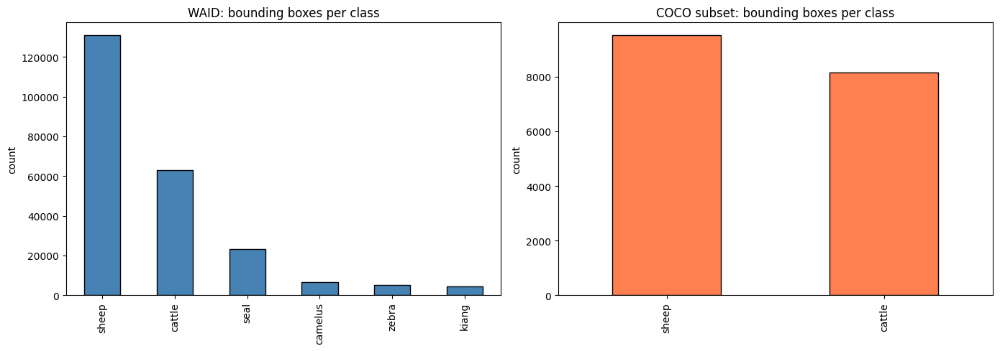

In [7]:
waid_class_counts = pd.Series([c for cs in waid_df["classes"] for c in cs]).value_counts()
coco_class_counts = pd.Series([c for cs in coco_df["classes"] for c in cs]).value_counts()

print("WAID bbox class counts:")
print(waid_class_counts)
print("COCO bbox class counts:")
print(coco_class_counts)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
waid_class_counts.plot(kind="bar", ax=axes[0], color="steelblue", edgecolor="black")
axes[0].set_title("WAID: bounding boxes per class")
axes[0].set_ylabel("count")
coco_class_counts.plot(kind="bar", ax=axes[1], color="coral", edgecolor="black")
axes[1].set_title("COCO subset: bounding boxes per class")
axes[1].set_ylabel("count")
plt.tight_layout()
plt.show()

I sample 1000 images per dataset and read their width and height. This gives me a feel for how much resizing will distort things, and whether aspect ratios are mostly square or stretched.

WAID image size describe():
        width  height  aspect
count  1000.0  1000.0  1000.0
mean    640.0   640.0     1.0
std       0.0     0.0     0.0
min     640.0   640.0     1.0
25%     640.0   640.0     1.0
50%     640.0   640.0     1.0
75%     640.0   640.0     1.0
max     640.0   640.0     1.0

COCO image size describe():
             width       height       aspect
count  1000.000000  1000.000000  1000.000000
mean    612.857000   458.845000     1.382367
std      65.781394    80.352184     0.302795
min     267.000000   165.000000     0.632812
25%     640.000000   426.000000     1.333333
50%     640.000000   439.500000     1.367521
75%     640.000000   480.000000     1.498829
max     640.000000   640.000000     3.878788


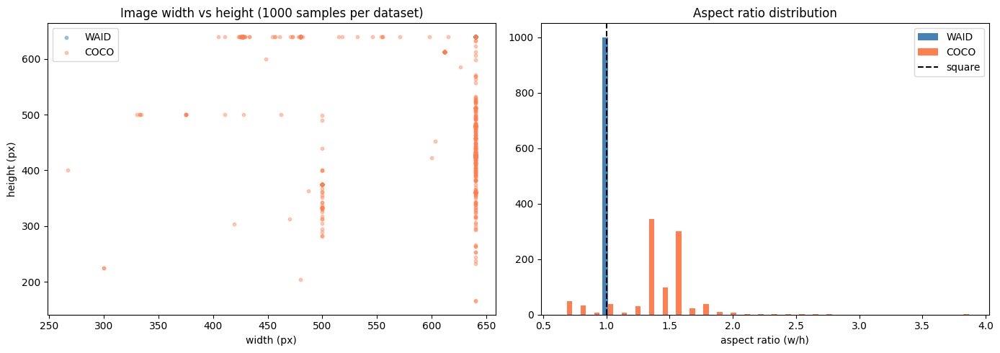

In [8]:
def sample_image_sizes(df, n=1000, seed=SEED):
    sample = df.sample(min(n, len(df)), random_state=seed)
    rows = []
    for _, r in sample.iterrows():
        try:
            with Image.open(r["image_path"]) as img:
                w, h = img.size
            rows.append({"source": r["source"], "width": w, "height": h, "aspect": w / h})
        except Exception:
            rows.append({"source": r["source"], "width": np.nan, "height": np.nan, "aspect": np.nan})
    return pd.DataFrame(rows)

sizes_waid = sample_image_sizes(waid_df, n=1000)
sizes_coco = sample_image_sizes(coco_df, n=1000)

print("WAID image size describe():")
print(sizes_waid[["width", "height", "aspect"]].describe())
print("COCO image size describe():")
print(sizes_coco[["width", "height", "aspect"]].describe())

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].scatter(sizes_waid["width"], sizes_waid["height"], alpha=0.4, s=10, label="WAID")
axes[0].scatter(sizes_coco["width"], sizes_coco["height"], alpha=0.4, s=10, color="coral", label="COCO")
axes[0].set_xlabel("width (px)")
axes[0].set_ylabel("height (px)")
axes[0].legend()
axes[0].set_title("Image width vs height (1000 samples per dataset)")

axes[1].hist(
    [sizes_waid["aspect"].dropna(), sizes_coco["aspect"].dropna()],
    bins=30, label=["WAID", "COCO"], color=["steelblue", "coral"],
)
axes[1].axvline(1.0, color="black", linestyle="--", label="square")
axes[1].set_xlabel("aspect ratio (w/h)")
axes[1].legend()
axes[1].set_title("Aspect ratio distribution")
plt.tight_layout()
plt.show()

I sample 400 images per dataset, resize to 224 and compute per-image mean, std, skew and kurtosis on pixel values. I also run Shapiro-Wilk on mean brightness to see if it is anywhere near normal (it is not, which is fine, I just want to know).

WAID pixel stats:
             mean         std        skew        kurt
count  400.000000  400.000000  400.000000  400.000000
mean   124.987892   35.624245   -0.301061    2.044716
std     32.995651   12.309906    1.090784    4.811993
min     43.591904   10.097001   -4.484864   -1.606161
25%    103.594849   27.204771   -0.831396   -0.146121
50%    124.284996   34.837210   -0.128001    0.964299
75%    146.331188   42.835876    0.470404    2.310185
max    244.739929   78.360474    2.379527   43.315291

COCO pixel stats:
             mean         std        skew        kurt
count  400.000000  400.000000  400.000000  400.000000
mean   113.570206   59.639206    0.277657   -0.437375
std     24.748037   13.975639    0.557274    1.715395
min     47.373314   16.284994   -4.505981   -1.812038
25%     97.075865   49.128035   -0.022775   -1.050371
50%    111.891045   59.448406    0.280100   -0.637758
75%    129.943474   69.296331    0.616036   -0.145021
max    223.531204   96.884789    1.788731   3

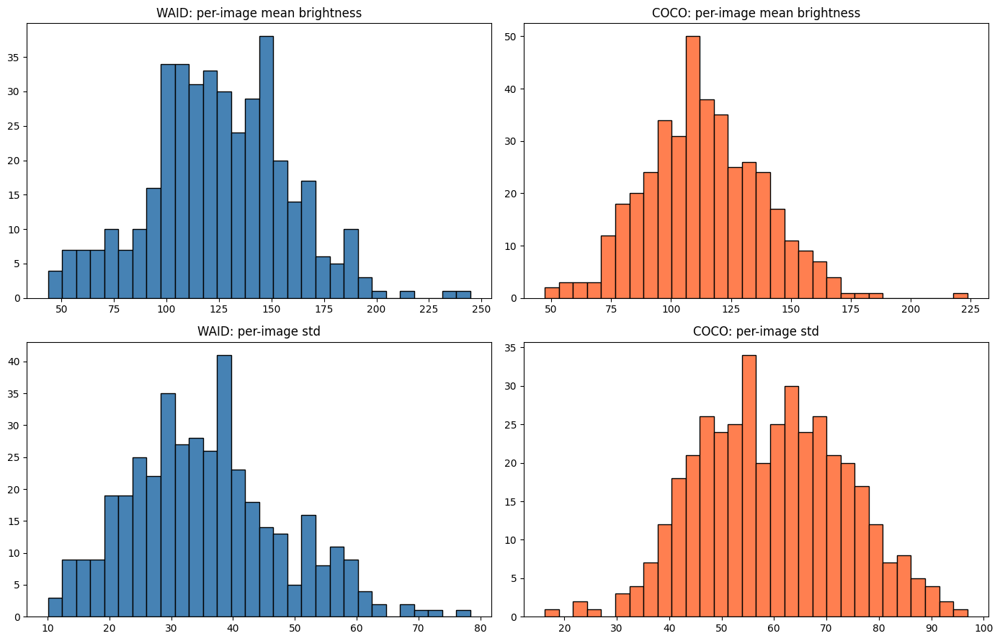

In [9]:
def pixel_stats(df, n=400, seed=SEED, target=224):
    sample = df.sample(min(n, len(df)), random_state=seed)
    rows = []
    for _, r in sample.iterrows():
        try:
            img = Image.open(r["image_path"]).convert("RGB").resize((target, target))
            arr = np.asarray(img).astype(np.float32)
            flat = arr.flatten()
            rows.append({
                "source": r["source"],
                "mean": arr.mean(),
                "std": arr.std(),
                "skew": stats.skew(flat),
                "kurt": stats.kurtosis(flat),
            })
        except Exception:
            pass
    return pd.DataFrame(rows)

stats_waid = pixel_stats(waid_df, n=400)
stats_coco = pixel_stats(coco_df, n=400)

print("WAID pixel stats:")
print(stats_waid.drop(columns=["source"]).describe())
print("COCO pixel stats:")
print(stats_coco.drop(columns=["source"]).describe())

print("Shapiro-Wilk on mean brightness (H0 = normal):")
for name, series in [("WAID", stats_waid["mean"]), ("COCO", stats_coco["mean"])]:
    w, p = stats.shapiro(series)
    verdict = "normal" if p > 0.05 else "not normal"
    print(f"  {name}: W={w:.4f}, p={p:.4e} -> {verdict}")

fig, axes = plt.subplots(2, 2, figsize=(14, 9))
axes[0, 0].hist(stats_waid["mean"], bins=30, color="steelblue", edgecolor="black")
axes[0, 0].set_title("WAID: per-image mean brightness")
axes[0, 1].hist(stats_coco["mean"], bins=30, color="coral", edgecolor="black")
axes[0, 1].set_title("COCO: per-image mean brightness")
axes[1, 0].hist(stats_waid["std"], bins=30, color="steelblue", edgecolor="black")
axes[1, 0].set_title("WAID: per-image std")
axes[1, 1].hist(stats_coco["std"], bins=30, color="coral", edgecolor="black")
axes[1, 1].set_title("COCO: per-image std")
plt.tight_layout()
plt.show()

An IQR-based outlier check on brightness and pixel std. Helps me see how many images are unusually dark/bright or low/high contrast before training. Also a couple of box plots for the same.

WAID brightness: 3 outliers outside [39.49, 210.44]  (IQR rule)
COCO brightness: 4 outliers outside [47.77, 179.24]  (IQR rule)
WAID std: 5 outliers outside [3.76, 66.28]  (IQR rule)
COCO std: 1 outliers outside [18.88, 99.55]  (IQR rule)


/var/folders/m7/56qd8wjd2cl8yjq17nwtyvk00000gn/T/ipykernel_3749/850598792.py:16: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[0].boxplot([stats_waid["mean"], stats_coco["mean"]], labels=["WAID", "COCO"])
/var/folders/m7/56qd8wjd2cl8yjq17nwtyvk00000gn/T/ipykernel_3749/850598792.py:18: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[1].boxplot([stats_waid["std"], stats_coco["std"]], labels=["WAID", "COCO"])


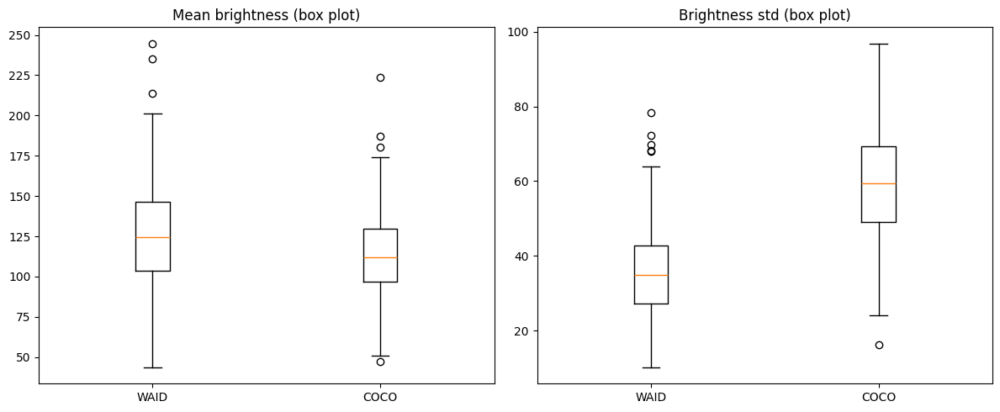

In [10]:
def iqr_outliers(series):
    q1, q3 = series.quantile(0.25), series.quantile(0.75)
    iqr = q3 - q1
    low, high = q1 - 1.5 * iqr, q3 + 1.5 * iqr
    n_out = ((series < low) | (series > high)).sum()
    return n_out, low, high

for name, series in [("WAID brightness", stats_waid["mean"]),
                     ("COCO brightness", stats_coco["mean"]),
                     ("WAID std", stats_waid["std"]),
                     ("COCO std", stats_coco["std"])]:
    n_out, lo, hi = iqr_outliers(series)
    print(f"{name}: {n_out} outliers outside [{lo:.2f}, {hi:.2f}]  (IQR rule)")

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].boxplot([stats_waid["mean"], stats_coco["mean"]], labels=["WAID", "COCO"])
axes[0].set_title("Mean brightness (box plot)")
axes[1].boxplot([stats_waid["std"], stats_coco["std"]], labels=["WAID", "COCO"])
axes[1].set_title("Brightness std (box plot)")
plt.tight_layout()
plt.show()

I open every image with PIL and call `verify()` to flag corrupt files. I want the count of broken images before I copy anything into the processed folder.

In [11]:
all_df = pd.concat([waid_df, coco_df], ignore_index=True)

corrupted = []
for path in all_df["image_path"]:
    try:
        with Image.open(path) as img:
            img.verify()
    except Exception as e:
        corrupted.append({"path": path, "error": str(e)})

print(f"total images checked: {len(all_df)}")
print(f"corrupted images:    {len(corrupted)}")
if corrupted:
    print("first 5 corrupted:")
    for c in corrupted[:5]:
        print(f"  {c['path']} -> {c['error']}")

total images checked: 17759
corrupted images:    0


Box-level statistics: normalised bbox area, aspect ratio and number of boxes per image. WAID tends to have a lot more small boxes per image than COCO, which matters for counting and for the detector.

bbox area and aspect by source:
       bbox_area_norm                                                    \
                count      mean       std       min       25%       50%   
source                                                                    
coco          17656.0  0.059376  0.119009  0.000014  0.002598  0.011532   
waid         233719.0  0.004313  0.008471  0.000002  0.001376  0.002077   

                           bbox_aspect                                \
             75%       max       count      mean       std       min   
source                                                                 
coco    0.052766  0.996403     17656.0  0.998188  0.861971  0.045547   
waid    0.004746  0.633389    233719.0  0.858012  0.716602  0.021053   

                                                 
             25%       50%       75%        max  
source                                           
coco    0.576307  0.836988  1.154061  29.481493  
waid    0.390805  0.640625  1.0

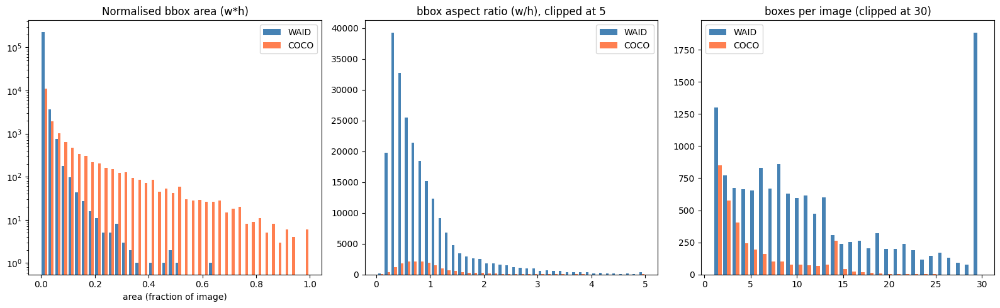

In [12]:
bbox_rows = []
for _, r in pd.concat([waid_df, coco_df]).iterrows():
    for cls, bb in zip(r["classes"], r["bboxes"]):
        cx, cy, w, h = bb
        bbox_rows.append({
            "source": r["source"],
            "class": cls,
            "bbox_area_norm": w * h,
            "bbox_aspect": w / h if h > 0 else np.nan,
        })

bbox_df = pd.DataFrame(bbox_rows)
print("bbox area and aspect by source:")
print(bbox_df.groupby("source")[["bbox_area_norm", "bbox_aspect"]].describe())
print("boxes per image:")
print(pd.concat([waid_df, coco_df]).groupby("source")["n_boxes"].describe())

fig, axes = plt.subplots(1, 3, figsize=(16, 5))
axes[0].hist(
    [bbox_df[bbox_df["source"] == "waid"]["bbox_area_norm"],
     bbox_df[bbox_df["source"] == "coco"]["bbox_area_norm"]],
    bins=40, label=["WAID", "COCO"], color=["steelblue", "coral"],
)
axes[0].set_title("Normalised bbox area (w*h)")
axes[0].set_xlabel("area (fraction of image)")
axes[0].legend()
axes[0].set_yscale("log")

axes[1].hist(
    [bbox_df[bbox_df["source"] == "waid"]["bbox_aspect"].clip(0, 5),
     bbox_df[bbox_df["source"] == "coco"]["bbox_aspect"].clip(0, 5)],
    bins=40, label=["WAID", "COCO"], color=["steelblue", "coral"],
)
axes[1].set_title("bbox aspect ratio (w/h), clipped at 5")
axes[1].legend()

axes[2].hist(
    [waid_df["n_boxes"].clip(0, 30), coco_df["n_boxes"].clip(0, 30)],
    bins=30, label=["WAID", "COCO"], color=["steelblue", "coral"],
)
axes[2].set_title("boxes per image (clipped at 30)")
axes[2].legend()
plt.tight_layout()
plt.show()

A visual sanity check. I show 8 random samples of cattle and sheep from each dataset, plus a few of the WAID classes I plan to drop. Just to confirm the labels actually match what is in the image.

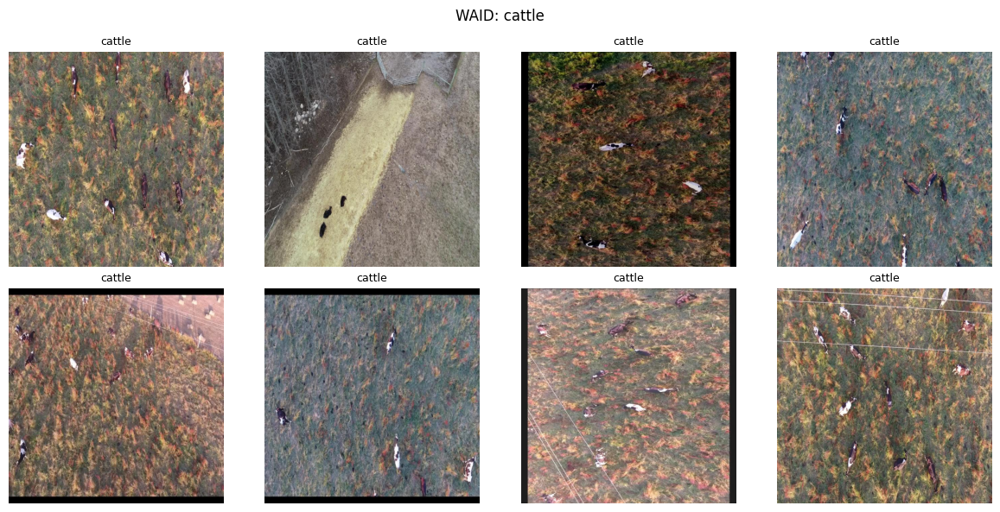

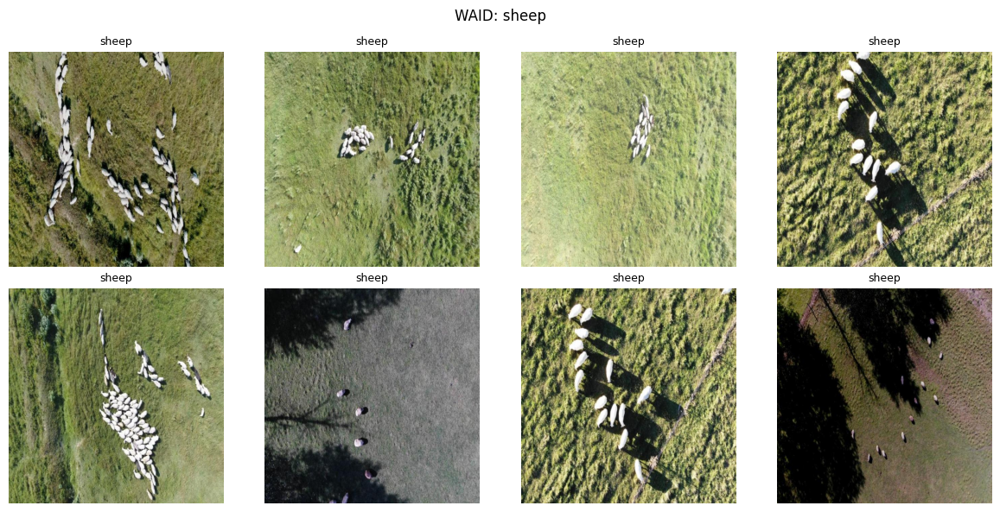

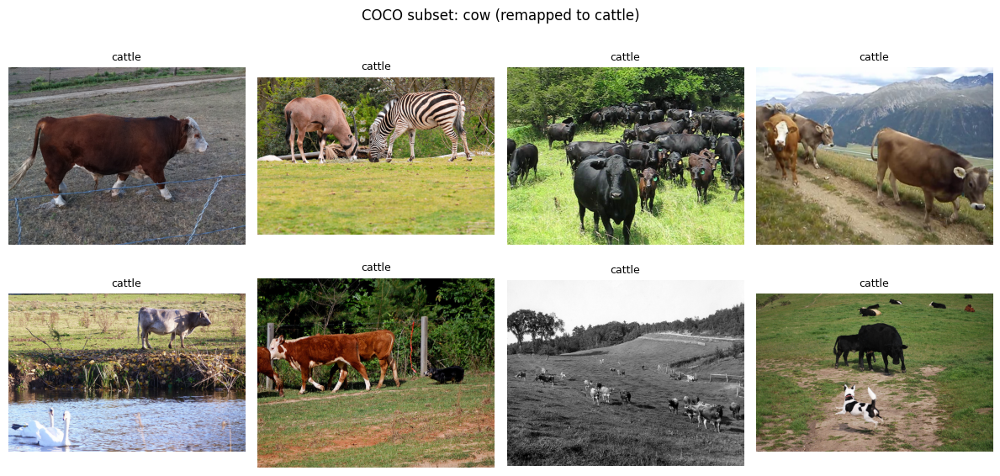

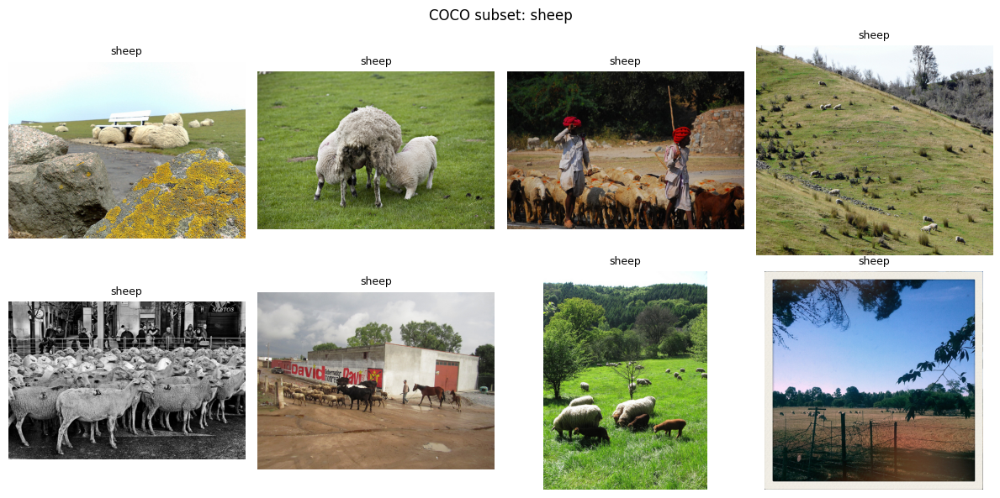

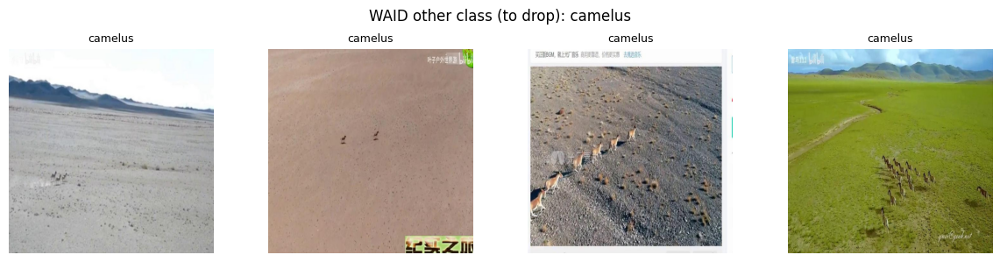

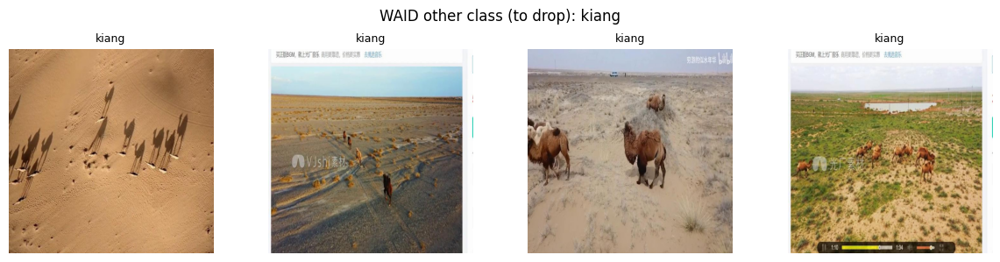

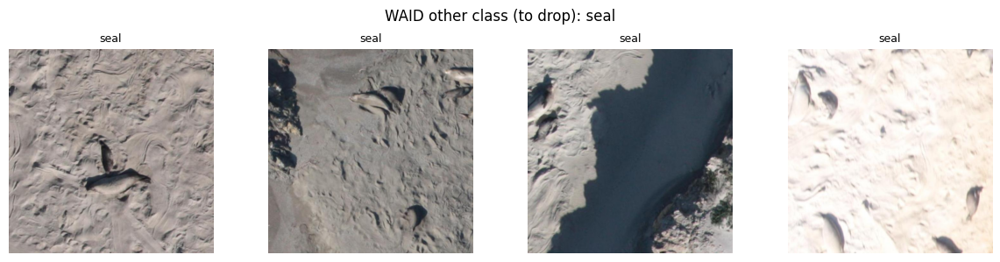

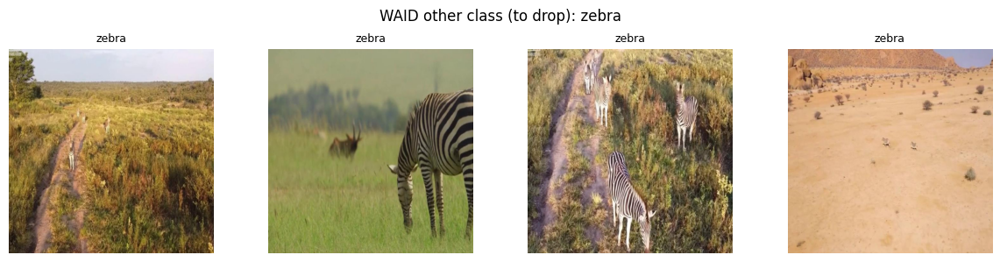

In [13]:
def show_samples(df, cls, n=8, cols=4, title=""):
    rows_with_cls = df[df["classes"].apply(lambda cs: cls in cs)]
    if len(rows_with_cls) == 0:
        print(f"no samples with class={cls}")
        return
    sample = rows_with_cls.sample(min(n, len(rows_with_cls)), random_state=SEED)
    rows_n = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows_n, cols, figsize=(cols * 3, rows_n * 3))
    axes = np.atleast_2d(axes).flatten()
    for i, (_, r) in enumerate(sample.iterrows()):
        img = Image.open(r["image_path"])
        axes[i].imshow(img)
        axes[i].set_title(cls, fontsize=9)
        axes[i].axis("off")
    for i in range(len(sample), len(axes)):
        axes[i].axis("off")
    fig.suptitle(title)
    plt.tight_layout()
    plt.show()

show_samples(waid_df, "cattle", n=8, title="WAID: cattle")
show_samples(waid_df, "sheep", n=8, title="WAID: sheep")
show_samples(coco_df, "cattle", n=8, title="COCO subset: cow (remapped to cattle)")
show_samples(coco_df, "sheep", n=8, title="COCO subset: sheep")
for cls in ("camelus", "kiang", "seal", "zebra"):
    show_samples(waid_df, cls, n=4, cols=4, title=f"WAID other class (to drop): {cls}")

A short text summary of the EDA: total images and boxes per source, class distributions, the classes I will keep, the corrupted count, and the Shapiro p-values. This block makes it easy to skim later without re-running the heavy cells.

In [14]:
print("--- summary ---")
print("total images:")
print(f"  WAID: {len(waid_df)}")
print(f"  COCO: {len(coco_df)}")

print("total boxes:")
print(f"  WAID: {waid_df['n_boxes'].sum()}")
print(f"  COCO: {coco_df['n_boxes'].sum()}")

print("WAID class distribution (boxes):")
print(waid_class_counts.to_string())

print("COCO class distribution (boxes):")
print(coco_class_counts.to_string())

print("keep: cattle, sheep")
print("drop from WAID: camelus, kiang, seal, zebra")

print(f"corrupted images: {len(corrupted)}")

print("shapiro-wilk:")
for name, series in [("WAID", stats_waid["mean"]), ("COCO", stats_coco["mean"])]:
    w, p = stats.shapiro(series)
    print(f"  {name}: p={p:.4e}")

summary

total images:
  WAID: 14366
  COCO: 3393
total boxes:
  WAID: 233719
  COCO: 17656
WAID class distribution (boxes):
sheep      130810
cattle      63090
seal        23362
camelus      6623
zebra        5225
kiang        4609
COCO class distribution (boxes):
sheep     9509
cattle    8147
classes to keep: cattle, sheep
classes to drop from WAID: camelus, kiang, seal, zebra
corrupted images: 0
normality (Shapiro-Wilk):
  WAID: p=6.8525e-02
  COCO: p=6.7546e-02


## Phase 3: preprocessing into YOLO layout and single-animal crops

I merge WAID and the COCO subset into one folder, remap COCO `cow` to `cattle`, drop everything that is not cattle or sheep, then make a stratified 70/15/15 train/val/test split at the image level. From the same images I also produce single-animal crops, which is what the classifiers will train on. Finally I assign a lighting label (dim/overcast/bright) and an occlusion label (low/medium/high) per image, and these are the subgroups I will use later in the analysis. At the end I preview the augmentations and print a summary.

Imports and config for preprocessing. Class map, split ratios, minimum bbox area to keep a crop, max crops per image. I cap crops per image at 5 so a single dense WAID image does not flood the classifier set.

In [15]:
from pathlib import Path
import random
import shutil

import numpy as np
import pandas as pd
import yaml
import matplotlib.pyplot as plt
from PIL import Image
import cv2
from sklearn.model_selection import train_test_split

SEED = 42
random.seed(SEED)
np.random.seed(SEED)

PROJECT_ROOT = Path.cwd()
if PROJECT_ROOT.name == "notebooks":
    PROJECT_ROOT = PROJECT_ROOT.parent

DATA_RAW = PROJECT_ROOT / "data" / "raw"
WAID_DIR = DATA_RAW / "waid"
COCO_DIR = DATA_RAW / "coco_cow_sheep" / "exported"
DATA_PROCESSED = PROJECT_ROOT / "data" / "processed"
DATA_CROPS = PROJECT_ROOT / "data" / "crops"

CLASS_MAP = {0: "cattle", 1: "sheep"}
CLASS_MAP_INV = {"cattle": 0, "sheep": 1}
KEEP_CLASSES = {"cattle", "sheep", "cow"}
SPLIT_TRAIN, SPLIT_VAL, SPLIT_TEST = 0.70, 0.15, 0.15
MIN_BBOX_AREA = 0.001
MAX_CROPS_PER_IMAGE = 5

pd.set_option("display.max_columns", None)
plt.rcParams["figure.figsize"] = (9, 5)

print("root:", PROJECT_ROOT)
print("classes:", CLASS_MAP)

project root: /Users/m/Documents/capstone-msc-da-feb-25-cohort-MeerimZhenisbekova
class map: {0: 'cattle', 1: 'sheep'}


Helpers for label parsing and a function that walks both datasets and builds a unified image index. I drop everything that is not cattle or sheep here. COCO `cow` gets renamed to `cattle` so the two sources line up.

In [16]:
with open(WAID_DIR / "data.yaml") as f:
    waid_meta = yaml.safe_load(f)
waid_names = waid_meta["names"]

with open(COCO_DIR / "dataset.yaml") as f:
    coco_meta = yaml.safe_load(f)
coco_names = coco_meta["names"]

def name_from(names, cls_id):
    if isinstance(names, dict):
        return names.get(cls_id, f"cls_{cls_id}")
    if isinstance(names, list) and 0 <= cls_id < len(names):
        return names[cls_id]
    return f"cls_{cls_id}"

def load_labels(lbl_path, names):
    rows = []
    if not lbl_path.exists():
        return rows
    for line in lbl_path.read_text().strip().splitlines():
        parts = line.split()
        if len(parts) < 5:
            continue
        cls_id = int(parts[0])
        cls_name = name_from(names, cls_id).lower()
        if cls_name == "cow":
            cls_name = "cattle"
        if cls_name not in KEEP_CLASSES or cls_name == "cow":
            continue
        cx, cy, w, h = map(float, parts[1:5])
        rows.append({
            "class": cls_name if cls_name != "cow" else "cattle",
            "cx": cx, "cy": cy, "w": w, "h": h,
        })
    return rows

def build_image_index():
    records = []
    for split in ("train", "valid", "test"):
        imgs_dir = WAID_DIR / split / "images"
        lbls_dir = WAID_DIR / split / "labels"
        for img in imgs_dir.glob("*.jpg"):
            lbl = lbls_dir / (img.stem + ".txt")
            boxes = load_labels(lbl, waid_names)
            if not boxes:
                continue
            records.append({"source": "waid", "image_path": str(img), "boxes": boxes})
    coco_imgs = COCO_DIR / "images" / "val"
    coco_lbls = COCO_DIR / "labels" / "val"
    for img in coco_imgs.glob("*"):
        if img.suffix.lower() not in (".jpg", ".jpeg", ".png"):
            continue
        lbl = coco_lbls / (img.stem + ".txt")
        boxes = load_labels(lbl, coco_names)
        if not boxes:
            continue
        records.append({"source": "coco", "image_path": str(img), "boxes": boxes})
    return pd.DataFrame(records)

index_df = build_image_index()
index_df["n_boxes"] = index_df["boxes"].apply(len)
index_df["primary_class"] = index_df["boxes"].apply(lambda bs: bs[0]["class"])
print("images kept after filtering to cattle/sheep:", len(index_df))
print("by source:", index_df["source"].value_counts().to_dict())
print("by primary class:", index_df["primary_class"].value_counts().to_dict())
index_df.head()

images kept after filtering to cattle/sheep: 12232
by source: {'waid': 8839, 'coco': 3393}
by primary class: {'cattle': 6548, 'sheep': 5684}


,source,image_path,boxes,n_boxes,primary_class
0,waid,/Users/m/Documents/capstone-msc-da-feb-25-coho...,"[{'class': 'cattle', 'cx': 0.6671875, 'cy': 0....",19,cattle
1,waid,/Users/m/Documents/capstone-msc-da-feb-25-coho...,"[{'class': 'cattle', 'cx': 0.80859375, 'cy': 0...",8,cattle
2,waid,/Users/m/Documents/capstone-msc-da-feb-25-coho...,"[{'class': 'cattle', 'cx': 0.58046875, 'cy': 0...",29,cattle
3,waid,/Users/m/Documents/capstone-msc-da-feb-25-coho...,"[{'class': 'sheep', 'cx': 0.22265625, 'cy': 0....",37,sheep
4,waid,/Users/m/Documents/capstone-msc-da-feb-25-coho...,"[{'class': 'sheep', 'cx': 0.503125, 'cy': 0.04...",20,sheep


I copy the kept images into a single `merged` folder and rewrite the labels with the unified class ids. Source-prefixed filenames keep WAID and COCO files from colliding.

In [17]:
MERGED_DIR = DATA_RAW / "merged"
MERGED_IMG = MERGED_DIR / "images"
MERGED_LBL = MERGED_DIR / "labels"
shutil.rmtree(MERGED_DIR, ignore_errors=True)
MERGED_IMG.mkdir(parents=True, exist_ok=True)
MERGED_LBL.mkdir(parents=True, exist_ok=True)

merged_paths = []
for i, row in index_df.iterrows():
    src_img = Path(row["image_path"])
    stem = f"{row['source']}_{i:06d}"
    dst_img = MERGED_IMG / (stem + src_img.suffix)
    shutil.copy(src_img, dst_img)
    lines = []
    for b in row["boxes"]:
        cls_id = CLASS_MAP_INV[b["class"]]
        lines.append(f"{cls_id} {b['cx']:.6f} {b['cy']:.6f} {b['w']:.6f} {b['h']:.6f}")
    (MERGED_LBL / (stem + ".txt")).write_text("\n".join(lines) + "\n")
    merged_paths.append(str(dst_img))

index_df["merged_path"] = merged_paths
print("merged images copied:", len(list(MERGED_IMG.glob('*'))))
print("merged labels copied:", len(list(MERGED_LBL.glob('*'))))

merged images copied: 12232
merged labels copied: 12232


A stratified 70/15/15 split at image level. The stratification key is the primary class of each image, so cattle and sheep stay roughly balanced across train/val/test. I copy images and labels into the final processed layout.

In [18]:
for split in ("train", "val", "test"):
    (DATA_PROCESSED / "images" / split).mkdir(parents=True, exist_ok=True)
    (DATA_PROCESSED / "labels" / split).mkdir(parents=True, exist_ok=True)

train_imgs, temp_imgs, train_cls, temp_cls = train_test_split(
    index_df["merged_path"].tolist(),
    index_df["primary_class"].tolist(),
    train_size=SPLIT_TRAIN,
    stratify=index_df["primary_class"].tolist(),
    random_state=SEED,
)
val_ratio_temp = SPLIT_VAL / (SPLIT_VAL + SPLIT_TEST)
val_imgs, test_imgs, val_cls, test_cls = train_test_split(
    temp_imgs, temp_cls,
    train_size=val_ratio_temp, stratify=temp_cls, random_state=SEED,
)

split_map = {}
for p in train_imgs: split_map[p] = "train"
for p in val_imgs:   split_map[p] = "val"
for p in test_imgs:  split_map[p] = "test"
index_df["split"] = index_df["merged_path"].map(split_map)

def place(paths, split):
    for p in paths:
        src = Path(p)
        shutil.copy(src, DATA_PROCESSED / "images" / split / src.name)
        lbl_src = MERGED_LBL / (src.stem + ".txt")
        shutil.copy(lbl_src, DATA_PROCESSED / "labels" / split / (src.stem + ".txt"))

place(train_imgs, "train")
place(val_imgs, "val")
place(test_imgs, "test")

print("split sizes (images):")
print(f"  train: {len(train_imgs)}")
print(f"  val: {len(val_imgs)}")
print(f"  test: {len(test_imgs)}")

print("class balance per split:")
for split, ys in [("train", train_cls), ("val", val_cls), ("test", test_cls)]:
    s = pd.Series(ys).value_counts()
    print(f"  {split}: {s.to_dict()}")

data_yaml = {
    "path": str(DATA_PROCESSED.resolve()),
    "train": "images/train",
    "val": "images/val",
    "test": "images/test",
    "names": {0: "cattle", 1: "sheep"},
}
with open(DATA_PROCESSED / "data.yaml", "w") as f:
    yaml.safe_dump(data_yaml, f, sort_keys=False)
print("wrote", DATA_PROCESSED / "data.yaml")

split sizes (images):
  train: 8562
  val:   1835
  test:  1835

class balance per split:
  train: {'cattle': 4583, 'sheep': 3979}
  val: {'cattle': 982, 'sheep': 853}
  test: {'cattle': 983, 'sheep': 852}
wrote /Users/m/Documents/capstone-msc-da-feb-25-cohort-MeerimZhenisbekova/data/processed/data.yaml


I crop every kept bounding box to its own image and save it under `data/crops/<split>/<class>/`. Tiny boxes are skipped so the classifier does not see 5x10-pixel mush. This is what the classifiers will train on later.

In [19]:
for split in ("train", "val", "test"):
    for name in ("cattle", "sheep"):
        (DATA_CROPS / split / name).mkdir(parents=True, exist_ok=True)

n_crops = {"train": {"cattle": 0, "sheep": 0},
           "val":   {"cattle": 0, "sheep": 0},
           "test":  {"cattle": 0, "sheep": 0}}
n_skipped_small = 0
n_skipped_tiny_crop = 0

for _, row in index_df.iterrows():
    split = row["split"]
    img_path = Path(row["image_path"])
    image = Image.open(img_path).convert("RGB")
    W, H = image.size
    boxes = row["boxes"]
    boxes_sorted = sorted(boxes, key=lambda b: -b["w"] * b["h"])
    used = 0
    for b in boxes_sorted:
        if used >= MAX_CROPS_PER_IMAGE:
            break
        area = b["w"] * b["h"]
        if area < MIN_BBOX_AREA:
            n_skipped_small += 1
            continue
        cls = b["class"]
        x1 = int((b["cx"] - b["w"] / 2) * W)
        y1 = int((b["cy"] - b["h"] / 2) * H)
        x2 = int((b["cx"] + b["w"] / 2) * W)
        y2 = int((b["cy"] + b["h"] / 2) * H)
        x1, y1 = max(0, x1), max(0, y1)
        x2, y2 = min(W, x2), min(H, y2)
        if x2 - x1 < 10 or y2 - y1 < 10:
            n_skipped_tiny_crop += 1
            continue
        crop = image.crop((x1, y1, x2, y2))
        out_name = f"{img_path.stem}_{used}.jpg"
        crop.save(DATA_CROPS / split / cls / out_name, quality=90)
        n_crops[split][cls] += 1
        used += 1

print("crops per split / class:")
for split in ("train", "val", "test"):
    print(f"  {split}: {n_crops[split]}")
print(f"skipped tiny area (<{MIN_BBOX_AREA}): {n_skipped_small}")
print(f"skipped <10px: {n_skipped_tiny_crop}")

crops per split / class:
  train: {'cattle': 18755, 'sheep': 17051}
  val: {'cattle': 4107, 'sheep': 3663}
  test: {'cattle': 4124, 'sheep': 3620}
skipped (area < 0.001): 5306
skipped (pixel < 10): 13


Subgroup labels per image. I use mean HSV V channel for lighting (dim/overcast/bright) and the largest pairwise IoU between bounding boxes for occlusion (low/medium/high). These get saved to a CSV and used in the final analysis to see how each model handles harder subsets.

In [20]:
def lighting_label(img_rgb):
    hsv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)
    v = hsv[..., 2].mean() / 255.0
    if v < 0.35:
        return "dim"
    if v < 0.65:
        return "overcast"
    return "bright"

def box_iou(a, b):
    ax1, ay1, ax2, ay2 = a
    bx1, by1, bx2, by2 = b
    ix1, iy1 = max(ax1, bx1), max(ay1, by1)
    ix2, iy2 = min(ax2, bx2), min(ay2, by2)
    iw, ih = max(0.0, ix2 - ix1), max(0.0, iy2 - iy1)
    inter = iw * ih
    area_a = max(0.0, ax2 - ax1) * max(0.0, ay2 - ay1)
    area_b = max(0.0, bx2 - bx1) * max(0.0, by2 - by1)
    union = area_a + area_b - inter
    return inter / union if union > 0 else 0.0

def occlusion_label(boxes_yolo):
    xyxy = []
    for b in boxes_yolo:
        cx, cy, w, h = b["cx"], b["cy"], b["w"], b["h"]
        xyxy.append((cx - w/2, cy - h/2, cx + w/2, cy + h/2))
    if len(xyxy) < 2:
        return "low"
    max_iou = 0.0
    for i in range(len(xyxy)):
        for j in range(i + 1, len(xyxy)):
            max_iou = max(max_iou, box_iou(xyxy[i], xyxy[j]))
    if max_iou < 0.1:
        return "low"
    if max_iou < 0.3:
        return "medium"
    return "high"

rows = []
for _, row in index_df.iterrows():
    img_bgr = cv2.imread(row["image_path"])
    if img_bgr is None:
        continue
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    rows.append({
        "image_id": Path(row["image_path"]).name,
        "source": row["source"],
        "split": row["split"],
        "primary_class": row["primary_class"],
        "n_boxes": row["n_boxes"],
        "lighting": lighting_label(img_rgb),
        "occlusion": occlusion_label(row["boxes"]),
    })

subgroup_df = pd.DataFrame(rows)
subgroup_csv = DATA_PROCESSED / "subgroup_labels.csv"
subgroup_df.to_csv(subgroup_csv, index=False)

print("wrote", subgroup_csv, "rows:", len(subgroup_df))
print("lighting counts:")
print(subgroup_df["lighting"].value_counts())
print("occlusion counts:")
print(subgroup_df["occlusion"].value_counts())
print("lighting x split:")
print(pd.crosstab(subgroup_df["split"], subgroup_df["lighting"]))
print("occlusion x split:")
print(pd.crosstab(subgroup_df["split"], subgroup_df["occlusion"]))

wrote /Users/m/Documents/capstone-msc-da-feb-25-cohort-MeerimZhenisbekova/data/processed/subgroup_labels.csv rows: 12232

lighting counts:
lighting
overcast    9652
dim         1395
bright      1185
Name: count, dtype: int64

occlusion counts:
occlusion
low       6259
medium    3074
high      2899
Name: count, dtype: int64

lighting x split:
lighting  bright  dim  overcast
split                          
test         196  206      1433
train        809  964      6789
val          180  225      1430

occlusion x split:
occlusion  high   low  medium
split                        
test        433   960     442
train      2027  4376    2159
val         439   923     473


Transforms for the classifier (224x224 input). Train uses horizontal flip, small rotation, and colour jitter. Eval is just resize and normalise. I also preview 9 augmentations of one sample to make sure nothing looks broken.

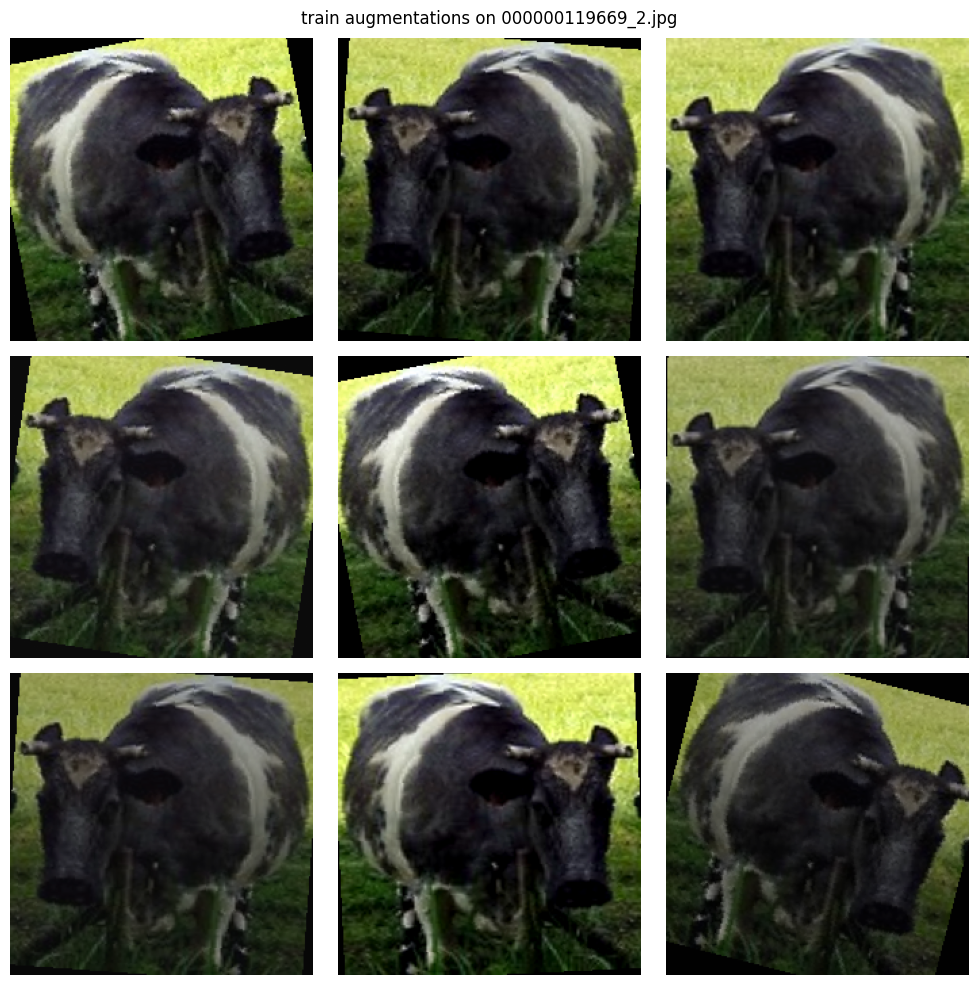

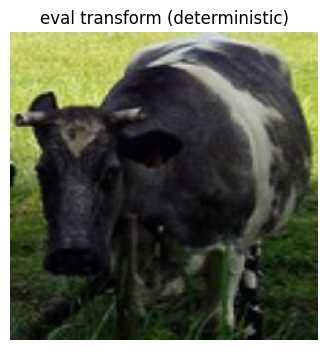

In [21]:
from torchvision import transforms
import torch

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]
IMG_SIZE = 224

train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

eval_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

def unnormalize(tensor):
    mean = torch.tensor(IMAGENET_MEAN).view(3, 1, 1)
    std = torch.tensor(IMAGENET_STD).view(3, 1, 1)
    return (tensor * std + mean).clamp(0, 1).permute(1, 2, 0).numpy()

sample_crops = list((DATA_CROPS / "train" / "cattle").glob("*.jpg"))
sample_path = sample_crops[0] if sample_crops else None

if sample_path is not None:
    img = Image.open(sample_path).convert("RGB")
    fig, axes = plt.subplots(3, 3, figsize=(10, 10))
    for ax in axes.flatten():
        t = train_transform(img)
        ax.imshow(unnormalize(t))
        ax.axis("off")
    fig.suptitle(f"train augmentations on {sample_path.name}")
    plt.tight_layout()
    plt.show()

    t_eval = eval_transform(img)
    plt.figure(figsize=(4, 4))
    plt.imshow(unnormalize(t_eval))
    plt.axis("off")
    plt.title("eval transform (deterministic)")
    plt.show()
else:
    print("no crop found to demo transforms on")

A short text summary: image counts per split, crop counts per split and class, paths to the subgroup CSV and YOLO yaml, and the train class balance. Same idea as the EDA summary cell.

In [22]:
print("--- summary ---")
print("processed dataset:")
for split in ("train", "val", "test"):
    n = len(list((DATA_PROCESSED / "images" / split).glob("*")))
    print(f"  {split}: {n} images")

print("crops for classifier:")
for split in ("train", "val", "test"):
    per_class = {c: len(list((DATA_CROPS / split / c).glob('*'))) for c in ("cattle", "sheep")}
    total = sum(per_class.values())
    print(f"  {split}: total={total}, {per_class}")

print("subgroup csv:", DATA_PROCESSED / "subgroup_labels.csv")
print("yolo yaml:", DATA_PROCESSED / "data.yaml")

print("train class balance:")
train_class_counts = {c: len(list((DATA_CROPS / 'train' / c).glob('*'))) for c in ("cattle", "sheep")}
total = sum(train_class_counts.values())
for c, n in train_class_counts.items():
    print(f"  {c}: {n} ({n/total*100:.1f}%)")

summary

processed dataset:
  train: 8562 images
  val: 1835 images
  test: 1835 images

classification crops:
  train: total=35806, {'cattle': 18755, 'sheep': 17051}


  val: total=7770, {'cattle': 4107, 'sheep': 3663}
  test: total=7744, {'cattle': 4124, 'sheep': 3620}

subgroup labels file: /Users/m/Documents/capstone-msc-da-feb-25-cohort-MeerimZhenisbekova/data/processed/subgroup_labels.csv
data yaml for YOLO:   /Users/m/Documents/capstone-msc-da-feb-25-cohort-MeerimZhenisbekova/data/processed/data.yaml

class imbalance (train):
  cattle: 18755 (52.4%)
  sheep: 17051 (47.6%)


## Phase 4: custom CNN trained from scratch

This is the baseline I want to compare the pretrained backbones against. I define a small configurable CNN (a few conv blocks with batchnorm and pooling, then a small MLP head) and let Optuna search over depth, width, kernel size, activation, dropout, learning rate, batch size and optimiser. Search runs on a 5000/1000 subset to be fast. Then I retrain the best config on the full data, evaluate on test, save Grad-CAM samples, and run a no-augmentation ablation as the H2 check.

Imports and config for the custom CNN. MPS fallback is enabled because a few ops still are not supported on Mac GPU. Image size is 128 here (smaller than the transfer-learning section) since this is a from-scratch model and a smaller input keeps it fast.

In [23]:
import os
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"

from pathlib import Path
import random
import json
import time

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Subset
from torchvision import transforms
from torchvision.datasets import ImageFolder
import optuna
from optuna.samplers import TPESampler
from sklearn.metrics import (accuracy_score, precision_score, recall_score,
                             f1_score, confusion_matrix, ConfusionMatrixDisplay)

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

PROJECT_ROOT = Path.cwd()
if PROJECT_ROOT.name == "notebooks":
    PROJECT_ROOT = PROJECT_ROOT.parent

DATA_CROPS = PROJECT_ROOT / "data" / "crops"
RUNS_DIR = PROJECT_ROOT / "runs" / "baseline_cnn"
RUNS_DIR.mkdir(parents=True, exist_ok=True)

DEVICE = "mps" if torch.backends.mps.is_available() else ("cuda" if torch.cuda.is_available() else "cpu")
IMG_SIZE = 128
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

print("device:", DEVICE)
print("img size:", IMG_SIZE)
print("data crops:", DATA_CROPS)
print("runs dir:", RUNS_DIR)

device: mps
img size: 128
data crops: /Users/m/Documents/capstone-msc-da-feb-25-cohort-MeerimZhenisbekova/data/crops
runs dir: /Users/m/Documents/capstone-msc-da-feb-25-cohort-MeerimZhenisbekova/runs/baseline_cnn


The same train/eval transforms I used in preprocessing, applied to the crop folders via `ImageFolder`. Class names come from the folder layout.

In [24]:
train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

eval_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

train_ds = ImageFolder(DATA_CROPS / "train", transform=train_transform)
val_ds = ImageFolder(DATA_CROPS / "val", transform=eval_transform)
test_ds = ImageFolder(DATA_CROPS / "test", transform=eval_transform)

classes = train_ds.classes
print("classes:", classes)
print(f"train: {len(train_ds)}, val: {len(val_ds)}, test: {len(test_ds)}")

classes: ['cattle', 'sheep']
train: 35806, val: 7770, test: 7744


The custom CNN. Configurable number of conv blocks, base channel count, kernel size, activation, dropout. Each block is conv + batchnorm + activation + maxpool. I compute the flatten dim with a dummy forward so the head adapts to whatever the conv stack produces.

In [25]:
class SimpleCNN(nn.Module):
    def __init__(self, n_conv_blocks=3, base_channels=32, kernel_size=3,
                 activation="relu", dropout=0.3, n_classes=2):
        super().__init__()
        act_map = {"relu": nn.ReLU, "leaky_relu": nn.LeakyReLU, "gelu": nn.GELU}
        Act = act_map[activation]
        layers = []
        in_ch = 3
        out_ch = base_channels
        for _ in range(n_conv_blocks):
            layers.append(nn.Conv2d(in_ch, out_ch, kernel_size=kernel_size, padding=kernel_size // 2))
            layers.append(nn.BatchNorm2d(out_ch))
            layers.append(Act())
            layers.append(nn.MaxPool2d(2))
            in_ch = out_ch
            out_ch = out_ch * 2
        self.features = nn.Sequential(*layers)
        with torch.no_grad():
            dummy = torch.zeros(1, 3, IMG_SIZE, IMG_SIZE)
            flat_dim = self.features(dummy).view(1, -1).shape[1]
        self.classifier = nn.Sequential(
            nn.Linear(flat_dim, 128),
            Act(),
            nn.Dropout(dropout),
            nn.Linear(128, n_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = x.flatten(1)
        return self.classifier(x)

demo = SimpleCNN()
print(demo)
print("total params:", sum(p.numel() for p in demo.parameters()))

SimpleCNN(
  (features): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU()
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Linear(in_features=32768, out_features=128, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.3, inplace=False)
    (3): Linear(i

Standard helpers: optimizer factory, single-epoch train loop, evaluation loop, and a `fit_model` with early stopping that returns the best state. I use these in both Phase 4 and Phase 5 (the helpers in Phase 5 are extended for transfer learning).

In [26]:
def make_optimizer(name, params, lr):
    if name == "adam":
        return torch.optim.Adam(params, lr=lr)
    if name == "adamw":
        return torch.optim.AdamW(params, lr=lr)
    return torch.optim.SGD(params, lr=lr, momentum=0.9)

def train_one_epoch(model, loader, optimizer, criterion, device):
    model.train()
    total_loss, total_correct, total = 0.0, 0, 0
    for imgs, labels in loader:
        imgs, labels = imgs.to(device), labels.to(device)
        optimizer.zero_grad()
        out = model(imgs)
        loss = criterion(out, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * imgs.size(0)
        total_correct += (out.argmax(1) == labels).sum().item()
        total += imgs.size(0)
    return total_loss / total, total_correct / total

def evaluate(model, loader, criterion, device):
    model.eval()
    total_loss = 0.0
    ys, ps = [], []
    with torch.no_grad():
        for imgs, labels in loader:
            imgs, labels = imgs.to(device), labels.to(device)
            out = model(imgs)
            loss = criterion(out, labels)
            total_loss += loss.item() * imgs.size(0)
            ys.extend(labels.cpu().numpy().tolist())
            ps.extend(out.argmax(1).cpu().numpy().tolist())
    acc = accuracy_score(ys, ps)
    return total_loss / len(loader.dataset), acc, np.array(ys), np.array(ps)

def fit_model(model, train_loader, val_loader, epochs, optimizer, criterion, device, patience=5, verbose=False):
    history = {"train_loss": [], "train_acc": [], "val_loss": [], "val_acc": []}
    best_val_acc = 0.0
    best_state = None
    patience_counter = 0
    for epoch in range(epochs):
        t0 = time.time()
        tl, ta = train_one_epoch(model, train_loader, optimizer, criterion, device)
        vl, va, _, _ = evaluate(model, val_loader, criterion, device)
        history["train_loss"].append(tl)
        history["train_acc"].append(ta)
        history["val_loss"].append(vl)
        history["val_acc"].append(va)
        if verbose:
            print(f"  epoch {epoch+1}: train_loss={tl:.4f} train_acc={ta:.4f} val_loss={vl:.4f} val_acc={va:.4f} ({time.time()-t0:.1f}s)")
        if va > best_val_acc:
            best_val_acc = va
            best_state = {k: v.detach().cpu().clone() for k, v in model.state_dict().items()}
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                if verbose:
                    print(f"  early stop at epoch {epoch+1}")
                break
    return history, best_state, best_val_acc

print("ok")

training utilities ready


Optuna objective. I run HP search on a 5000-image train subset and 1000-image val subset to keep each trial under a few minutes. The search space covers architecture (blocks, channels, kernel, activation, dropout) and optimisation (lr, batch size, optimizer). Each trial trains for 5 epochs and returns best val acc.

In [27]:
SUBSET_TRAIN = 5000
SUBSET_VAL = 1000
HP_EPOCHS = 5

rng = np.random.RandomState(SEED)
train_idx = rng.choice(len(train_ds), size=SUBSET_TRAIN, replace=False).tolist()
val_idx = rng.choice(len(val_ds), size=SUBSET_VAL, replace=False).tolist()

sub_train = Subset(train_ds, train_idx)
sub_val = Subset(val_ds, val_idx)

print(f"HP subsets: train={len(sub_train)}, val={len(sub_val)}")

def objective(trial):
    n_blocks = trial.suggest_int("n_conv_blocks", 2, 4)
    base_ch = trial.suggest_categorical("base_channels", [16, 32, 64])
    ksz = trial.suggest_categorical("kernel_size", [3, 5])
    act = trial.suggest_categorical("activation", ["relu", "leaky_relu", "gelu"])
    drop = trial.suggest_float("dropout", 0.0, 0.5)
    lr = trial.suggest_float("lr", 1e-4, 1e-2, log=True)
    bs = trial.suggest_categorical("batch_size", [32, 64, 128])
    opt_name = trial.suggest_categorical("optimizer", ["adam", "adamw", "sgd"])

    model = SimpleCNN(
        n_conv_blocks=n_blocks,
        base_channels=base_ch,
        kernel_size=ksz,
        activation=act,
        dropout=drop,
    ).to(DEVICE)
    optimizer = make_optimizer(opt_name, model.parameters(), lr)
    criterion = nn.CrossEntropyLoss()
    tr_loader = DataLoader(sub_train, batch_size=bs, shuffle=True, num_workers=0)
    val_loader = DataLoader(sub_val, batch_size=bs, shuffle=False, num_workers=0)

    _, _, best_val = fit_model(model, tr_loader, val_loader, HP_EPOCHS,
                                optimizer, criterion, DEVICE, patience=3, verbose=False)
    return best_val

HP subsets: train=5000, val=1000


The actual Optuna study. 15 trials with the TPE sampler. Storage is sqlite so I can resume the study if the kernel dies. I print best val acc and best params when it is done.

In [28]:
HP_TRIALS = 15
sampler = TPESampler(seed=SEED)
study = optuna.create_study(direction="maximize", sampler=sampler,
                             study_name="cnn_baseline",
                             storage=f"sqlite:///{RUNS_DIR / 'optuna.db'}",
                             load_if_exists=True)

t0 = time.time()
study.optimize(objective, n_trials=HP_TRIALS, show_progress_bar=False)
print(f"\nHP search done in {time.time()-t0:.1f}s")
print(f"best val acc: {study.best_value:.4f}")
print("best params:")
for k, v in study.best_params.items():
    print(f"  {k}: {v}")

[I 2026-04-23 11:04:23,950] A new study created in RDB with name: cnn_baseline


[I 2026-04-23 11:05:04,309] Trial 0 finished with value: 0.9 and parameters: {'n_conv_blocks': 3, 'base_channels': 16, 'kernel_size': 3, 'activation': 'leaky_relu', 'dropout': 0.35403628889802274, 'lr': 0.00010994335574766199, 'batch_size': 32, 'optimizer': 'sgd'}. Best is trial 0 with value: 0.9.


[I 2026-04-23 11:08:28,709] Trial 1 finished with value: 0.92 and parameters: {'n_conv_blocks': 3, 'base_channels': 64, 'kernel_size': 5, 'activation': 'gelu', 'dropout': 0.09983689107917987, 'lr': 0.0010677482709481358, 'batch_size': 128, 'optimizer': 'sgd'}. Best is trial 1 with value: 0.92.


[I 2026-04-23 11:09:06,981] Trial 2 finished with value: 0.909 and parameters: {'n_conv_blocks': 4, 'base_channels': 16, 'kernel_size': 3, 'activation': 'leaky_relu', 'dropout': 0.45466020103939103, 'lr': 0.00032927591344236165, 'batch_size': 32, 'optimizer': 'sgd'}. Best is trial 1 with value: 0.92.


[I 2026-04-23 11:09:44,044] Trial 3 finished with value: 0.91 and parameters: {'n_conv_blocks': 4, 'base_channels': 16, 'kernel_size': 3, 'activation': 'gelu', 'dropout': 0.194338644844741, 'lr': 0.00034889766548903674, 'batch_size': 32, 'optimizer': 'sgd'}. Best is trial 1 with value: 0.92.


[I 2026-04-23 11:10:21,318] Trial 4 finished with value: 0.901 and parameters: {'n_conv_blocks': 2, 'base_channels': 16, 'kernel_size': 5, 'activation': 'gelu', 'dropout': 0.03702232586704518, 'lr': 0.0005211124595788264, 'batch_size': 64, 'optimizer': 'adam'}. Best is trial 1 with value: 0.92.


[I 2026-04-23 11:11:48,801] Trial 5 finished with value: 0.907 and parameters: {'n_conv_blocks': 2, 'base_channels': 64, 'kernel_size': 3, 'activation': 'leaky_relu', 'dropout': 0.3854835899772805, 'lr': 0.0009718319944817398, 'batch_size': 32, 'optimizer': 'sgd'}. Best is trial 1 with value: 0.92.


[I 2026-04-23 11:12:55,379] Trial 6 finished with value: 0.92 and parameters: {'n_conv_blocks': 2, 'base_channels': 32, 'kernel_size': 5, 'activation': 'gelu', 'dropout': 0.08061064362700221, 'lr': 0.007234279845665418, 'batch_size': 128, 'optimizer': 'sgd'}. Best is trial 1 with value: 0.92.


[I 2026-04-23 11:14:19,976] Trial 7 finished with value: 0.922 and parameters: {'n_conv_blocks': 3, 'base_channels': 32, 'kernel_size': 5, 'activation': 'gelu', 'dropout': 0.0034760652655953517, 'lr': 0.001050738402418141, 'batch_size': 32, 'optimizer': 'adamw'}. Best is trial 7 with value: 0.922.


[I 2026-04-23 11:16:17,092] Trial 8 finished with value: 0.923 and parameters: {'n_conv_blocks': 3, 'base_channels': 64, 'kernel_size': 3, 'activation': 'relu', 'dropout': 0.018443473677266398, 'lr': 0.001656260589333597, 'batch_size': 32, 'optimizer': 'adam'}. Best is trial 8 with value: 0.923.


[I 2026-04-23 11:16:51,284] Trial 9 finished with value: 0.92 and parameters: {'n_conv_blocks': 3, 'base_channels': 16, 'kernel_size': 3, 'activation': 'relu', 'dropout': 0.31676485538044735, 'lr': 0.0011790965486776312, 'batch_size': 64, 'optimizer': 'sgd'}. Best is trial 8 with value: 0.923.


[I 2026-04-23 11:19:10,715] Trial 10 finished with value: 0.873 and parameters: {'n_conv_blocks': 4, 'base_channels': 64, 'kernel_size': 3, 'activation': 'relu', 'dropout': 0.19860453818223114, 'lr': 0.005247086148453287, 'batch_size': 64, 'optimizer': 'adam'}. Best is trial 8 with value: 0.923.


[I 2026-04-23 11:20:47,990] Trial 11 finished with value: 0.899 and parameters: {'n_conv_blocks': 3, 'base_channels': 32, 'kernel_size': 5, 'activation': 'relu', 'dropout': 0.006295689993706109, 'lr': 0.0035240007744626873, 'batch_size': 32, 'optimizer': 'adamw'}. Best is trial 8 with value: 0.923.


[I 2026-04-23 11:22:29,225] Trial 12 finished with value: 0.907 and parameters: {'n_conv_blocks': 3, 'base_channels': 32, 'kernel_size': 5, 'activation': 'relu', 'dropout': 0.134120361690769, 'lr': 0.002393719194281379, 'batch_size': 32, 'optimizer': 'adamw'}. Best is trial 8 with value: 0.923.


[I 2026-04-23 11:24:06,451] Trial 13 finished with value: 0.912 and parameters: {'n_conv_blocks': 3, 'base_channels': 32, 'kernel_size': 5, 'activation': 'gelu', 'dropout': 0.039012476606078095, 'lr': 0.0020975457910271662, 'batch_size': 32, 'optimizer': 'adam'}. Best is trial 8 with value: 0.923.


[I 2026-04-23 11:25:44,752] Trial 14 finished with value: 0.901 and parameters: {'n_conv_blocks': 2, 'base_channels': 64, 'kernel_size': 3, 'activation': 'relu', 'dropout': 0.15685565295679038, 'lr': 0.0005779908321591065, 'batch_size': 128, 'optimizer': 'adamw'}. Best is trial 8 with value: 0.923.



HP search done in 1280.8s
best val acc: 0.9230
best params:
  n_conv_blocks: 3
  base_channels: 64
  kernel_size: 3
  activation: relu
  dropout: 0.018443473677266398
  lr: 0.001656260589333597
  batch_size: 32
  optimizer: adam


A look at the trials: top 5 by val acc, parameter importances, and two Optuna built-in plots (optimisation history and importance bars). Tells me which knobs actually mattered.

completed trials: 15

top 5 trials by val acc:
   number  value  params_n_conv_blocks  params_base_channels  params_kernel_size params_activation params_optimizer  params_lr
8       8  0.923                     3                    64                   3              relu             adam   0.001656
7       7  0.922                     3                    32                   5              gelu            adamw   0.001051
1       1  0.920                     3                    64                   5              gelu              sgd   0.001068
6       6  0.920                     2                    32                   5              gelu              sgd   0.007234
9       9  0.920                     3                    16                   3              relu              sgd   0.001179



param importances:
  lr: 0.366
  batch_size: 0.189
  optimizer: 0.143
  n_conv_blocks: 0.131
  dropout: 0.071
  activation: 0.051
  base_channels: 0.028
  kernel_size: 0.019


/var/folders/m7/56qd8wjd2cl8yjq17nwtyvk00000gn/T/ipykernel_17624/3673141833.py:19: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_optimization_history(study)


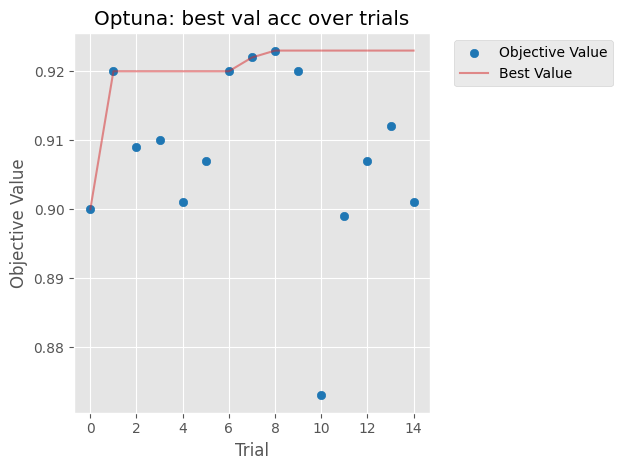

/var/folders/m7/56qd8wjd2cl8yjq17nwtyvk00000gn/T/ipykernel_17624/3673141833.py:24: ExperimentalWarning: optuna.visualization.matplotlib._param_importances.plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_param_importances(study)


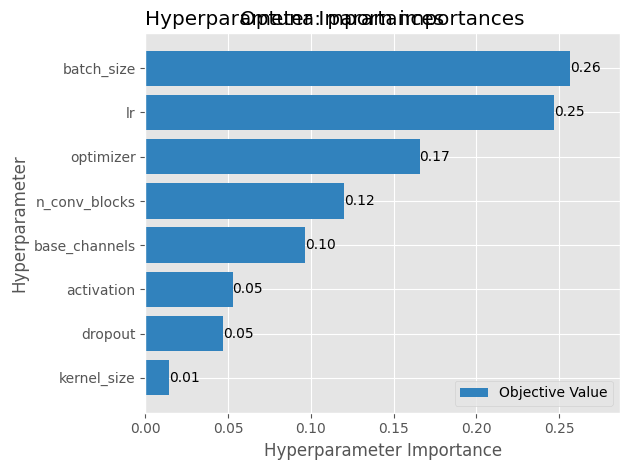

In [29]:
trials_df = study.trials_dataframe()
print(f"completed trials: {len(trials_df)}")
print("top 5 trials by val acc:")
print(trials_df.sort_values("value", ascending=False).head(5)[
    ["number", "value", "params_n_conv_blocks", "params_base_channels",
     "params_kernel_size", "params_activation", "params_optimizer", "params_lr"]
].to_string())

try:
    importances = optuna.importance.get_param_importances(study)
    print("param importances:")
    for k, v in importances.items():
        print(f"  {k}: {v:.3f}")
except Exception as e:
    print(f"importance calc failed: {e}")

fig = optuna.visualization.matplotlib.plot_optimization_history(study)
plt.title("Optuna: best val acc over trials")
plt.tight_layout()
plt.show()

fig = optuna.visualization.matplotlib.plot_param_importances(study)
plt.title("Optuna: param importances")
plt.tight_layout()
plt.show()

I retrain the best config on the full training data for up to 25 epochs with early stopping (patience 6). I save the best weights and plot loss and accuracy curves. This is the model I will report numbers on.

training final model with best HP on full dataset...
{'n_conv_blocks': 3, 'base_channels': 64, 'kernel_size': 3, 'activation': 'relu', 'dropout': 0.018443473677266398, 'lr': 0.001656260589333597, 'batch_size': 32, 'optimizer': 'adam'}


  epoch 1: train_loss=0.4137 train_acc=0.8919 val_loss=0.1809 val_acc=0.9293 (177.9s)


  epoch 2: train_loss=0.2054 train_acc=0.9201 val_loss=0.3191 val_acc=0.8708 (173.2s)


  epoch 3: train_loss=0.1865 train_acc=0.9248 val_loss=0.1804 val_acc=0.9373 (173.3s)


  epoch 4: train_loss=0.1772 train_acc=0.9304 val_loss=0.1804 val_acc=0.9341 (170.6s)


  epoch 5: train_loss=0.1653 train_acc=0.9323 val_loss=0.1530 val_acc=0.9434 (173.3s)


  epoch 6: train_loss=0.1538 train_acc=0.9383 val_loss=0.1610 val_acc=0.9347 (173.0s)


  epoch 7: train_loss=0.1517 train_acc=0.9381 val_loss=0.1247 val_acc=0.9525 (173.1s)


  epoch 8: train_loss=0.1360 train_acc=0.9436 val_loss=0.1383 val_acc=0.9450 (174.5s)


  epoch 9: train_loss=0.1312 train_acc=0.9461 val_loss=0.1195 val_acc=0.9550 (178.8s)


  epoch 10: train_loss=0.1253 train_acc=0.9484 val_loss=0.1085 val_acc=0.9559 (183.7s)


  epoch 11: train_loss=0.1189 train_acc=0.9509 val_loss=0.1148 val_acc=0.9547 (177.0s)


  epoch 12: train_loss=0.1132 train_acc=0.9532 val_loss=0.1378 val_acc=0.9494 (181.8s)


  epoch 13: train_loss=0.1111 train_acc=0.9542 val_loss=0.1315 val_acc=0.9481 (190.2s)


  epoch 14: train_loss=0.1082 train_acc=0.9539 val_loss=0.1149 val_acc=0.9559 (182.2s)


  epoch 15: train_loss=0.1028 train_acc=0.9577 val_loss=0.1042 val_acc=0.9609 (183.7s)


  epoch 16: train_loss=0.0996 train_acc=0.9580 val_loss=0.1165 val_acc=0.9564 (184.8s)


  epoch 17: train_loss=0.0950 train_acc=0.9594 val_loss=0.1109 val_acc=0.9569 (185.0s)


  epoch 18: train_loss=0.0960 train_acc=0.9596 val_loss=0.0999 val_acc=0.9600 (185.3s)


  epoch 19: train_loss=0.0893 train_acc=0.9620 val_loss=0.1114 val_acc=0.9595 (187.0s)


  epoch 20: train_loss=0.0890 train_acc=0.9625 val_loss=0.1034 val_acc=0.9593 (188.1s)


  epoch 21: train_loss=0.0861 train_acc=0.9636 val_loss=0.1170 val_acc=0.9583 (189.0s)
  early stop at epoch 21

best val acc on full val: 0.9609
saved model to /Users/m/Documents/capstone-msc-da-feb-25-cohort-MeerimZhenisbekova/runs/baseline_cnn/best_cnn.pt


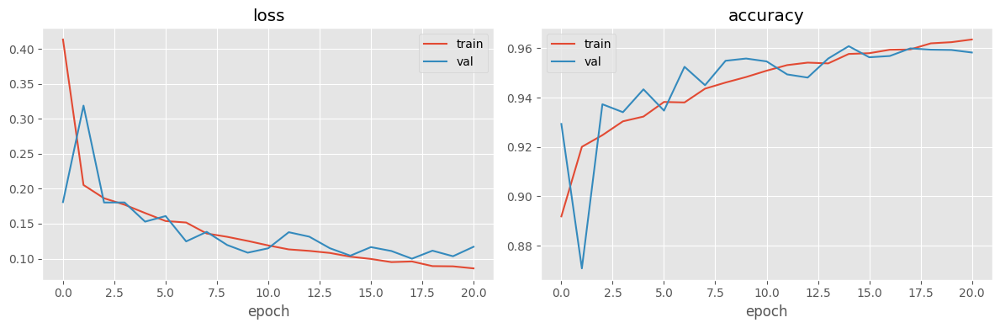

In [30]:
best_params = study.best_params
print("train final on full data")
print(best_params)

final_model = SimpleCNN(
    n_conv_blocks=best_params["n_conv_blocks"],
    base_channels=best_params["base_channels"],
    kernel_size=best_params["kernel_size"],
    activation=best_params["activation"],
    dropout=best_params["dropout"],
).to(DEVICE)
final_optimizer = make_optimizer(best_params["optimizer"], final_model.parameters(), best_params["lr"])
criterion = nn.CrossEntropyLoss()

FINAL_EPOCHS = 25
BS = best_params["batch_size"]
full_train_loader = DataLoader(train_ds, batch_size=BS, shuffle=True, num_workers=0)
full_val_loader = DataLoader(val_ds, batch_size=BS, shuffle=False, num_workers=0)

history, best_state, best_val_acc = fit_model(
    final_model, full_train_loader, full_val_loader, FINAL_EPOCHS,
    final_optimizer, criterion, DEVICE, patience=6, verbose=True,
)
print(f"\nbest val acc: {best_val_acc:.4f}")
final_model.load_state_dict(best_state)
torch.save(best_state, RUNS_DIR / "best_cnn.pt")
print("saved:", RUNS_DIR / "best_cnn.pt")

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].plot(history["train_loss"], label="train")
axes[0].plot(history["val_loss"], label="val")
axes[0].set_title("loss")
axes[0].set_xlabel("epoch")
axes[0].legend()
axes[1].plot(history["train_acc"], label="train")
axes[1].plot(history["val_acc"], label="val")
axes[1].set_title("accuracy")
axes[1].set_xlabel("epoch")
axes[1].legend()
plt.tight_layout()
plt.show()

Test-set evaluation. Accuracy, macro precision, recall, f1 and the confusion matrix. I also save y_true and y_pred to .npy files so the comparison notebook section can load them later for McNemar.

test metrics (custom CNN):
  accuracy:  0.9610
  precision: 0.9610
  recall:    0.9606
  f1:        0.9608


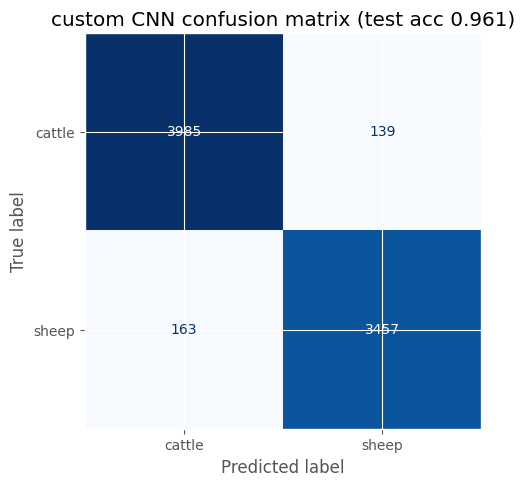


saved /Users/m/Documents/capstone-msc-da-feb-25-cohort-MeerimZhenisbekova/runs/baseline_cnn/test_results.json
saved ground truth and predictions for later comparison


In [31]:
test_loader = DataLoader(test_ds, batch_size=64, shuffle=False, num_workers=0)
test_loss, test_acc, ys, ps = evaluate(final_model, test_loader, criterion, DEVICE)

precision = precision_score(ys, ps, average="macro")
recall = recall_score(ys, ps, average="macro")
f1 = f1_score(ys, ps, average="macro")

print("test metrics:")
print(f"  acc: {test_acc:.4f}")
print(f"  precision: {precision:.4f}")
print(f"  recall: {recall:.4f}")
print(f"  f1: {f1:.4f}")

cm = confusion_matrix(ys, ps)
fig, ax = plt.subplots(figsize=(5, 5))
ConfusionMatrixDisplay(cm, display_labels=classes).plot(ax=ax, cmap="Blues", colorbar=False)
ax.set_title(f"custom CNN confusion matrix (test acc {test_acc:.3f})")
plt.tight_layout()
plt.show()

results_row = {
    "model": "custom_cnn",
    "best_val_acc": float(best_val_acc),
    "test_acc": float(test_acc),
    "precision": float(precision),
    "recall": float(recall),
    "f1": float(f1),
    "confusion_matrix": cm.tolist(),
    "best_params": best_params,
}
with open(RUNS_DIR / "test_results.json", "w") as f:
    json.dump(results_row, f, indent=2)
print("saved", RUNS_DIR / "test_results.json")

np.save(RUNS_DIR / "test_ys.npy", ys)
np.save(RUNS_DIR / "test_ps.npy", ps)
print("saved ys, ps")

Grad-CAM on the last conv layer for 10 random test crops. Just a sanity check that I want to do: the CAM should light up on the animal, not on the background grass.

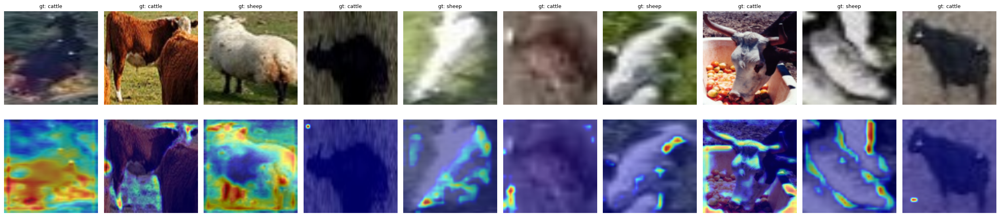

saved grad-cam grid


In [32]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image

conv_layers = [m for m in final_model.features if isinstance(m, nn.Conv2d)]
target_layers = [conv_layers[-1]]
cam = GradCAM(model=final_model, target_layers=target_layers)

n_samples = 10
sample_indices = np.random.RandomState(SEED).choice(len(test_ds), size=n_samples, replace=False)

fig, axes = plt.subplots(2, n_samples, figsize=(n_samples * 2.5, 6))
mean_t = torch.tensor(IMAGENET_MEAN).view(3, 1, 1)
std_t = torch.tensor(IMAGENET_STD).view(3, 1, 1)

for i, idx in enumerate(sample_indices):
    img_tensor, label = test_ds[idx]
    img_rgb = (img_tensor * std_t + mean_t).clamp(0, 1).permute(1, 2, 0).numpy()
    grayscale = cam(input_tensor=img_tensor.unsqueeze(0).to(DEVICE))[0]
    visualization = show_cam_on_image(img_rgb, grayscale, use_rgb=True)
    axes[0, i].imshow(img_rgb)
    axes[0, i].set_title(f"gt: {classes[label]}", fontsize=9)
    axes[0, i].axis("off")
    axes[1, i].imshow(visualization)
    axes[1, i].axis("off")

axes[0, 0].set_ylabel("original", rotation=90, labelpad=10)
axes[1, 0].set_ylabel("grad-cam", rotation=90, labelpad=10)
plt.tight_layout()
plt.savefig(RUNS_DIR / "grad_cam_samples.png", dpi=100, bbox_inches="tight")
plt.show()
print("grad-cam done")

Ablation for H2: I retrain the same architecture on the same data but with the augmentation transform replaced by plain resize and normalise. Then I compare test acc with and without augmentation. The delta is what I report for the augmentation hypothesis.

In [33]:
noaug_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])
train_ds_noaug = ImageFolder(DATA_CROPS / "train", transform=noaug_transform)

ablation_model = SimpleCNN(
    n_conv_blocks=best_params["n_conv_blocks"],
    base_channels=best_params["base_channels"],
    kernel_size=best_params["kernel_size"],
    activation=best_params["activation"],
    dropout=best_params["dropout"],
).to(DEVICE)
ablation_optimizer = make_optimizer(best_params["optimizer"], ablation_model.parameters(), best_params["lr"])

train_loader_noaug = DataLoader(train_ds_noaug, batch_size=BS, shuffle=True, num_workers=0)
print("ablation: no aug")
ablation_history, ablation_state, ablation_val_acc = fit_model(
    ablation_model, train_loader_noaug, full_val_loader, FINAL_EPOCHS,
    ablation_optimizer, criterion, DEVICE, patience=6, verbose=True,
)
ablation_model.load_state_dict(ablation_state)
torch.save(ablation_state, RUNS_DIR / "ablation_cnn_noaug.pt")

_, ablation_test_acc, _, _ = evaluate(ablation_model, test_loader, criterion, DEVICE)

print("ablation:")
print(f"  with aug: val={best_val_acc:.4f}, test={test_acc:.4f}")
print(f"  no aug:   val={ablation_val_acc:.4f}, test={ablation_test_acc:.4f}")
print(f"  aug delta on test: {test_acc - ablation_test_acc:+.4f}")

ablation_row = {
    "model": "custom_cnn_noaug",
    "val_acc": float(ablation_val_acc),
    "test_acc": float(ablation_test_acc),
    "augmentation_delta": float(test_acc - ablation_test_acc),
}
with open(RUNS_DIR / "ablation_results.json", "w") as f:
    json.dump(ablation_row, f, indent=2)
print("saved", RUNS_DIR / "ablation_results.json")

training ablation (no augmentation)...


  epoch 1: train_loss=0.3796 train_acc=0.9083 val_loss=0.1660 val_acc=0.9304 (185.4s)


  epoch 2: train_loss=0.1726 train_acc=0.9312 val_loss=0.1330 val_acc=0.9443 (181.1s)


  epoch 3: train_loss=0.1665 train_acc=0.9315 val_loss=0.1472 val_acc=0.9411 (180.2s)


  epoch 4: train_loss=0.1532 train_acc=0.9397 val_loss=0.1742 val_acc=0.9282 (185.2s)


  epoch 5: train_loss=0.1353 train_acc=0.9448 val_loss=0.2898 val_acc=0.9046 (180.7s)


  epoch 6: train_loss=0.1289 train_acc=0.9468 val_loss=0.1511 val_acc=0.9425 (181.2s)


  epoch 7: train_loss=0.1128 train_acc=0.9534 val_loss=0.1880 val_acc=0.9444 (180.1s)


  epoch 8: train_loss=0.1060 train_acc=0.9555 val_loss=0.1338 val_acc=0.9484 (187.3s)


  epoch 9: train_loss=0.0927 train_acc=0.9601 val_loss=0.1541 val_acc=0.9461 (181.2s)


  epoch 10: train_loss=0.0804 train_acc=0.9636 val_loss=0.1682 val_acc=0.9529 (180.1s)


  epoch 11: train_loss=0.0739 train_acc=0.9668 val_loss=0.1361 val_acc=0.9541 (183.2s)


  epoch 12: train_loss=0.0653 train_acc=0.9694 val_loss=0.1420 val_acc=0.9472 (182.0s)


  epoch 13: train_loss=0.0588 train_acc=0.9728 val_loss=0.1462 val_acc=0.9514 (180.8s)


  epoch 14: train_loss=0.0520 train_acc=0.9762 val_loss=0.1595 val_acc=0.9463 (181.0s)


  epoch 15: train_loss=0.0456 train_acc=0.9779 val_loss=0.1641 val_acc=0.9530 (187.2s)


  epoch 16: train_loss=0.0425 train_acc=0.9796 val_loss=0.1656 val_acc=0.9541 (181.6s)


  epoch 17: train_loss=0.0401 train_acc=0.9818 val_loss=0.1989 val_acc=0.9535 (182.2s)
  early stop at epoch 17



ablation summary:
  with augmentation    : val_acc=0.9609, test_acc=0.9610
  without augmentation : val_acc=0.9541, test_acc=0.9548
  augmentation contribution (test acc): +0.0062
saved /Users/m/Documents/capstone-msc-da-feb-25-cohort-MeerimZhenisbekova/runs/baseline_cnn/ablation_results.json


Custom CNN summary block: total params, image size, HP trial count, final epochs, test metrics, augmentation delta, and a list of saved artefacts.

In [34]:
print("--- custom cnn summary ---")
print(f"params: {sum(p.numel() for p in final_model.parameters()):,}")
print(f"img: {IMG_SIZE}x{IMG_SIZE}")
print(f"hp trials: {HP_TRIALS}")
print(f"final epochs: up to {FINAL_EPOCHS} (es patience 6)")
print(f"test acc: {test_acc:.4f}")
print(f"precision (macro): {precision:.4f}")
print(f"recall (macro): {recall:.4f}")
print(f"f1 (macro): {f1:.4f}")
print("h2 aug delta on test:", f"{test_acc - ablation_test_acc:+.4f}")
print("artifacts in", RUNS_DIR)
for p in sorted(RUNS_DIR.glob("*")):
    size = p.stat().st_size / 1024
    unit = "KB" if size < 1024 else "MB"
    size = size if size < 1024 else size / 1024
    print(f"  {p.name}: {size:.1f} {unit}")

custom CNN baseline: summary for comparative notebook

model params:      8,760,706
img size:          128x128
HP trials:         15
final epochs:      up to 25 (early stop patience 6)

test accuracy:     0.9610
precision (macro): 0.9610
recall    (macro): 0.9606
f1        (macro): 0.9608

H2 (augmentation matters): delta on test acc = +0.0062

artifacts in /Users/m/Documents/capstone-msc-da-feb-25-cohort-MeerimZhenisbekova/runs/baseline_cnn
  ablation_cnn_noaug.pt: 33.4 MB
  ablation_results.json: 0.1 KB
  best_cnn.pt: 33.4 MB
  grad_cam_samples.png: 1.2 MB
  optuna.db: 128.0 KB
  test_ps.npy: 60.6 KB
  test_results.json: 0.5 KB
  test_ys.npy: 60.6 KB


## Phase 5: transfer learning (ResNet50, VGG16, MobileNetV2)

Same problem, three pretrained ImageNet backbones, feature extraction only. I freeze every backbone parameter and only train a small classifier head on top. Optuna does a smaller HP search per backbone (lr, weight decay, dropout, batch size, optimizer), then I retrain each one on the full training set for 10 epochs and evaluate on test. I keep image size at 224 here to match the ImageNet preprocessing the backbones were trained on.

Imports and config for the transfer-learning section. Same pattern as Phase 4 but image size is 224 and runs go to per-model subfolders under `runs/`.

In [35]:
import os
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"

from pathlib import Path
import random
import json
import time

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Subset
from torchvision import transforms, models
from torchvision.datasets import ImageFolder
import optuna
from optuna.samplers import TPESampler
from sklearn.metrics import (accuracy_score, precision_score, recall_score,
                             f1_score, confusion_matrix, ConfusionMatrixDisplay)

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

PROJECT_ROOT = Path.cwd()
if PROJECT_ROOT.name == "notebooks":
    PROJECT_ROOT = PROJECT_ROOT.parent

DATA_CROPS = PROJECT_ROOT / "data" / "crops"
RUNS_BASE = PROJECT_ROOT / "runs"

DEVICE = "mps" if torch.backends.mps.is_available() else ("cuda" if torch.cuda.is_available() else "cpu")
IMG_SIZE = 224
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

print("device:", DEVICE)
print("img size:", IMG_SIZE)

device: mps
img size: 224


Transforms and ImageFolder datasets at 224x224. Same augmentations as Phase 4.

In [36]:
train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

eval_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

train_ds = ImageFolder(DATA_CROPS / "train", transform=train_transform)
val_ds = ImageFolder(DATA_CROPS / "val", transform=eval_transform)
test_ds = ImageFolder(DATA_CROPS / "test", transform=eval_transform)
classes = train_ds.classes
print("classes:", classes)
print(f"train: {len(train_ds)}, val: {len(val_ds)}, test: {len(test_ds)}")

classes: ['cattle', 'sheep']
train: 35806, val: 7770, test: 7744


Three model factories: ResNet50, VGG16, MobileNetV2. Each one freezes the backbone and replaces the classifier head with a small linear -> ReLU -> dropout -> linear stack with 2 outputs. I print param counts for each so I can see how much I am actually training.

In [37]:
def make_resnet50(dropout=0.3):
    model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)
    for p in model.parameters():
        p.requires_grad = False
    in_f = model.fc.in_features
    model.fc = nn.Sequential(
        nn.Linear(in_f, 128),
        nn.ReLU(),
        nn.Dropout(dropout),
        nn.Linear(128, 2),
    )
    return model

def make_vgg16(dropout=0.3):
    model = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)
    for p in model.parameters():
        p.requires_grad = False
    model.classifier = nn.Sequential(
        nn.Flatten(),
        nn.Linear(512 * 7 * 7, 128),
        nn.ReLU(),
        nn.Dropout(dropout),
        nn.Linear(128, 2),
    )
    return model

def make_mobilenet_v2(dropout=0.3):
    model = models.mobilenet_v2(weights=models.MobileNet_V2_Weights.IMAGENET1K_V1)
    for p in model.parameters():
        p.requires_grad = False
    in_f = model.classifier[1].in_features
    model.classifier = nn.Sequential(
        nn.Dropout(dropout),
        nn.Linear(in_f, 128),
        nn.ReLU(),
        nn.Dropout(dropout),
        nn.Linear(128, 2),
    )
    return model

MODEL_FACTORIES = {
    "resnet50": make_resnet50,
    "vgg16": make_vgg16,
    "mobilenet_v2": make_mobilenet_v2,
}

for name, factory in MODEL_FACTORIES.items():
    m = factory()
    total = sum(p.numel() for p in m.parameters())
    trainable = sum(p.numel() for p in m.parameters() if p.requires_grad)
    print(f"{name}: total={total:,} trainable={trainable:,} ({100*trainable/total:.2f}%)")

resnet50: total=23,770,562 trainable=262,530 (1.10%)


vgg16: total=17,926,338 trainable=3,211,650 (17.92%)
mobilenet_v2: total=2,388,098 trainable=164,226 (6.88%)


Train and eval helpers. Same idea as Phase 4 but the optimiser only sees parameters with `requires_grad=True`, which here is just the new head. I also added weight decay support.

In [38]:
def make_optimizer(name, params, lr, weight_decay=0.0):
    trainable = [p for p in params if p.requires_grad]
    if name == "adam":
        return torch.optim.Adam(trainable, lr=lr, weight_decay=weight_decay)
    if name == "adamw":
        return torch.optim.AdamW(trainable, lr=lr, weight_decay=weight_decay)
    return torch.optim.SGD(trainable, lr=lr, momentum=0.9, weight_decay=weight_decay)

def train_one_epoch(model, loader, optimizer, criterion, device):
    model.train()
    total_loss, total_correct, total = 0.0, 0, 0
    for imgs, labels in loader:
        imgs, labels = imgs.to(device), labels.to(device)
        optimizer.zero_grad()
        out = model(imgs)
        loss = criterion(out, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * imgs.size(0)
        total_correct += (out.argmax(1) == labels).sum().item()
        total += imgs.size(0)
    return total_loss / total, total_correct / total

def evaluate(model, loader, criterion, device):
    model.eval()
    total_loss = 0.0
    ys, ps = [], []
    with torch.no_grad():
        for imgs, labels in loader:
            imgs, labels = imgs.to(device), labels.to(device)
            out = model(imgs)
            loss = criterion(out, labels)
            total_loss += loss.item() * imgs.size(0)
            ys.extend(labels.cpu().numpy().tolist())
            ps.extend(out.argmax(1).cpu().numpy().tolist())
    acc = accuracy_score(ys, ps)
    return total_loss / len(loader.dataset), acc, np.array(ys), np.array(ps)

def fit_model(model, tr_loader, val_loader, epochs, optimizer, criterion, device, patience=4, verbose=False):
    history = {"train_loss": [], "train_acc": [], "val_loss": [], "val_acc": []}
    best_val, best_state, patience_n = 0.0, None, 0
    for epoch in range(epochs):
        t0 = time.time()
        tl, ta = train_one_epoch(model, tr_loader, optimizer, criterion, device)
        vl, va, _, _ = evaluate(model, val_loader, criterion, device)
        history["train_loss"].append(tl)
        history["train_acc"].append(ta)
        history["val_loss"].append(vl)
        history["val_acc"].append(va)
        if verbose:
            print(f"  epoch {epoch+1}: train_acc={ta:.4f} val_acc={va:.4f} ({time.time()-t0:.1f}s)")
        if va > best_val:
            best_val = va
            best_state = {k: v.detach().cpu().clone() for k, v in model.state_dict().items()}
            patience_n = 0
        else:
            patience_n += 1
            if patience_n >= patience:
                if verbose:
                    print(f"  early stop at epoch {epoch+1}")
                break
    return history, best_state, best_val

print("ok")

utilities ready


Optuna objective for transfer learning. Smaller search than Phase 4 (lr, weight decay, dropout, batch size, optimizer) because there are fewer architectural choices to make. Train subset is 3000, val 600, 3 epochs per trial, 6 trials per backbone, which keeps the whole sweep within a sensible budget.

In [39]:
SUBSET_TRAIN = 3000
SUBSET_VAL = 600
HP_EPOCHS = 3
HP_TRIALS = 6

rng = np.random.RandomState(SEED)
sub_train_idx = rng.choice(len(train_ds), size=SUBSET_TRAIN, replace=False).tolist()
sub_val_idx = rng.choice(len(val_ds), size=SUBSET_VAL, replace=False).tolist()
sub_train = Subset(train_ds, sub_train_idx)
sub_val = Subset(val_ds, sub_val_idx)
print(f"subset train={len(sub_train)}, val={len(sub_val)}")

def objective_for(backbone_name):
    factory = MODEL_FACTORIES[backbone_name]

    def objective(trial):
        lr = trial.suggest_float("lr", 1e-5, 1e-3, log=True)
        wd = trial.suggest_float("weight_decay", 0.0, 1e-3)
        dropout = trial.suggest_float("dropout", 0.1, 0.5)
        bs = trial.suggest_categorical("batch_size", [16, 32, 64])
        opt = trial.suggest_categorical("optimizer", ["adam", "adamw"])

        model = factory(dropout=dropout).to(DEVICE)
        optimizer = make_optimizer(opt, model.parameters(), lr, weight_decay=wd)
        criterion = nn.CrossEntropyLoss()
        tr = DataLoader(sub_train, batch_size=bs, shuffle=True, num_workers=0)
        va = DataLoader(sub_val, batch_size=bs, shuffle=False, num_workers=0)
        _, _, best = fit_model(model, tr, va, HP_EPOCHS, optimizer, criterion, DEVICE, patience=2)
        return best

    return objective

print("ok")

subset train=3000, val=600
objective builder ready


Run the HP search for all three backbones in a loop, each one with its own Optuna study and sqlite storage. Best val acc and best params are printed per model.

In [40]:
studies = {}
for name in ("resnet50", "vgg16", "mobilenet_v2"):
    run_dir = RUNS_BASE / name
    run_dir.mkdir(parents=True, exist_ok=True)
    print(f"\n=== HP search for {name} ===")
    sampler = TPESampler(seed=SEED)
    study = optuna.create_study(
        direction="maximize",
        sampler=sampler,
        study_name=f"{name}_transfer",
        storage=f"sqlite:///{run_dir / 'optuna.db'}",
        load_if_exists=True,
    )
    t0 = time.time()
    study.optimize(objective_for(name), n_trials=HP_TRIALS, show_progress_bar=False)
    print(f"done in {time.time()-t0:.1f}s; best val acc: {study.best_value:.4f}")
    print(f"best params: {study.best_params}")
    studies[name] = study


=== HP search for resnet50 ===


[I 2026-04-23 18:12:41,947] Using an existing study with name 'resnet50_transfer' instead of creating a new one.


[I 2026-04-23 18:14:19,905] Trial 6 finished with value: 0.9033333333333333 and parameters: {'lr': 5.6115164153345e-05, 'weight_decay': 0.0009507143064099162, 'dropout': 0.39279757672456206, 'batch_size': 16, 'optimizer': 'adamw'}. Best is trial 1 with value: 0.9183333333333333.


[I 2026-04-23 18:16:37,089] Trial 7 finished with value: 0.9183333333333333 and parameters: {'lr': 0.00015930522616241006, 'weight_decay': 0.0007080725777960455, 'dropout': 0.10823379771832098, 'batch_size': 16, 'optimizer': 'adamw'}. Best is trial 1 with value: 0.9183333333333333.


[I 2026-04-23 18:18:40,120] Trial 8 finished with value: 0.8883333333333333 and parameters: {'lr': 4.059611610484306e-05, 'weight_decay': 0.0005247564316322379, 'dropout': 0.2727780074568463, 'batch_size': 32, 'optimizer': 'adamw'}. Best is trial 1 with value: 0.9183333333333333.


[I 2026-04-23 18:20:42,829] Trial 9 finished with value: 0.905 and parameters: {'lr': 8.168455894760161e-05, 'weight_decay': 0.0007851759613930136, 'dropout': 0.1798695128633439, 'batch_size': 32, 'optimizer': 'adam'}. Best is trial 1 with value: 0.9183333333333333.


[I 2026-04-23 18:22:44,237] Trial 10 finished with value: 0.9233333333333333 and parameters: {'lr': 0.0006038889580599074, 'weight_decay': 5.997182955817478e-06, 'dropout': 0.20340815903401854, 'batch_size': 64, 'optimizer': 'adam'}. Best is trial 10 with value: 0.9233333333333333.


[I 2026-04-23 18:24:44,012] Trial 11 finished with value: 0.9266666666666666 and parameters: {'lr': 0.0006548373730929827, 'weight_decay': 1.5594799658456382e-05, 'dropout': 0.1978761396414842, 'batch_size': 64, 'optimizer': 'adam'}. Best is trial 11 with value: 0.9266666666666666.


[I 2026-04-23 18:24:44,026] Using an existing study with name 'vgg16_transfer' instead of creating a new one.


done in 722.1s; best val acc: 0.9267
best params: {'lr': 0.0006548373730929827, 'weight_decay': 1.5594799658456382e-05, 'dropout': 0.1978761396414842, 'batch_size': 64, 'optimizer': 'adam'}

=== HP search for vgg16 ===


[I 2026-04-23 18:27:51,900] Trial 6 finished with value: 0.9433333333333334 and parameters: {'lr': 5.6115164153345e-05, 'weight_decay': 0.0009507143064099162, 'dropout': 0.39279757672456206, 'batch_size': 16, 'optimizer': 'adamw'}. Best is trial 1 with value: 0.9516666666666667.


[I 2026-04-23 18:31:00,443] Trial 7 finished with value: 0.955 and parameters: {'lr': 0.00015930522616241006, 'weight_decay': 0.0007080725777960455, 'dropout': 0.10823379771832098, 'batch_size': 16, 'optimizer': 'adamw'}. Best is trial 7 with value: 0.955.


[I 2026-04-23 18:34:06,095] Trial 8 finished with value: 0.9416666666666667 and parameters: {'lr': 4.059611610484306e-05, 'weight_decay': 0.0005247564316322379, 'dropout': 0.2727780074568463, 'batch_size': 32, 'optimizer': 'adamw'}. Best is trial 7 with value: 0.955.


[I 2026-04-23 18:37:10,708] Trial 9 finished with value: 0.9366666666666666 and parameters: {'lr': 8.168455894760161e-05, 'weight_decay': 0.0007851759613930136, 'dropout': 0.1798695128633439, 'batch_size': 32, 'optimizer': 'adam'}. Best is trial 7 with value: 0.955.


[I 2026-04-23 18:40:16,664] Trial 10 finished with value: 0.955 and parameters: {'lr': 0.0006038889580599074, 'weight_decay': 5.997182955817478e-06, 'dropout': 0.20340815903401854, 'batch_size': 64, 'optimizer': 'adam'}. Best is trial 7 with value: 0.955.


[I 2026-04-23 18:43:23,704] Trial 11 finished with value: 0.9433333333333334 and parameters: {'lr': 0.0006548373730929827, 'weight_decay': 1.5594799658456382e-05, 'dropout': 0.1978761396414842, 'batch_size': 64, 'optimizer': 'adam'}. Best is trial 7 with value: 0.955.


[I 2026-04-23 18:43:23,725] Using an existing study with name 'mobilenet_v2_transfer' instead of creating a new one.


done in 1119.7s; best val acc: 0.9550
best params: {'lr': 0.00015930522616241006, 'weight_decay': 0.0007080725777960455, 'dropout': 0.10823379771832098, 'batch_size': 16, 'optimizer': 'adamw'}

=== HP search for mobilenet_v2 ===


[I 2026-04-23 18:44:12,307] Trial 6 finished with value: 0.8833333333333333 and parameters: {'lr': 5.6115164153345e-05, 'weight_decay': 0.0009507143064099162, 'dropout': 0.39279757672456206, 'batch_size': 16, 'optimizer': 'adamw'}. Best is trial 1 with value: 0.8966666666666666.


[I 2026-04-23 18:44:59,263] Trial 7 finished with value: 0.885 and parameters: {'lr': 0.00015930522616241006, 'weight_decay': 0.0007080725777960455, 'dropout': 0.10823379771832098, 'batch_size': 16, 'optimizer': 'adamw'}. Best is trial 1 with value: 0.8966666666666666.


[I 2026-04-23 18:45:43,817] Trial 8 finished with value: 0.855 and parameters: {'lr': 4.059611610484306e-05, 'weight_decay': 0.0005247564316322379, 'dropout': 0.2727780074568463, 'batch_size': 32, 'optimizer': 'adamw'}. Best is trial 1 with value: 0.8966666666666666.


[I 2026-04-23 18:46:28,303] Trial 9 finished with value: 0.89 and parameters: {'lr': 8.168455894760161e-05, 'weight_decay': 0.0007851759613930136, 'dropout': 0.1798695128633439, 'batch_size': 32, 'optimizer': 'adam'}. Best is trial 1 with value: 0.8966666666666666.


[I 2026-04-23 18:47:11,319] Trial 10 finished with value: 0.89 and parameters: {'lr': 0.0006038889580599074, 'weight_decay': 5.997182955817478e-06, 'dropout': 0.20340815903401854, 'batch_size': 64, 'optimizer': 'adam'}. Best is trial 1 with value: 0.8966666666666666.


[I 2026-04-23 18:47:54,499] Trial 11 finished with value: 0.865 and parameters: {'lr': 0.00022431069969720084, 'weight_decay': 0.00075160019384588, 'dropout': 0.17818220701568344, 'batch_size': 64, 'optimizer': 'adam'}. Best is trial 1 with value: 0.8966666666666666.


done in 270.8s; best val acc: 0.8967
best params: {'lr': 0.00015930522616241006, 'weight_decay': 0.0007080725777960455, 'dropout': 0.10823379771832098, 'batch_size': 16, 'optimizer': 'adamw'}


A small table summarising best val acc and best params per backbone.

In [41]:
print("--- hp summary (transfer) ---")
summary_rows = []
for name, study in studies.items():
    row = {"model": name, "best_val_acc": study.best_value, **study.best_params}
    summary_rows.append(row)
    print(f"{name}: val_acc={study.best_value:.4f}")
    for k, v in study.best_params.items():
        print(f"  {k}: {v}")

hp_summary_df = pd.DataFrame(summary_rows)
print(hp_summary_df.to_string(index=False))

HP summary across all transfer models

resnet50: val_acc=0.9267
  lr: 0.0006548373730929827
  weight_decay: 1.5594799658456382e-05
  dropout: 0.1978761396414842
  batch_size: 64
  optimizer: adam

vgg16: val_acc=0.9550
  lr: 0.00015930522616241006
  weight_decay: 0.0007080725777960455
  dropout: 0.10823379771832098
  batch_size: 16
  optimizer: adamw

mobilenet_v2: val_acc=0.8967
  lr: 0.00015930522616241006
  weight_decay: 0.0007080725777960455
  dropout: 0.10823379771832098
  batch_size: 16
  optimizer: adamw

       model  best_val_acc       lr  weight_decay  dropout  batch_size optimizer
    resnet50      0.926667 0.000655      0.000016 0.197876          64      adam
       vgg16      0.955000 0.000159      0.000708 0.108234          16     adamw
mobilenet_v2      0.896667 0.000159      0.000708 0.108234          16     adamw


Final retraining for each backbone on the full training data for 10 epochs. If cached results and weights exist on disk I skip retraining and just reload, which saved a lot of time during development. Test metrics are computed and saved exactly the same way as for the custom CNN.


=== resnet50 ===
loading cached results and weights


resnet50 test: acc=0.9570 P=0.9567 R=0.9570 F1=0.9568


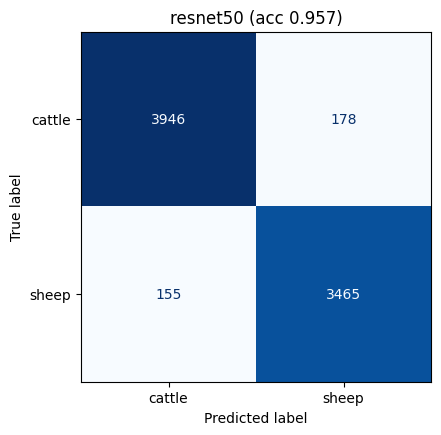


=== vgg16 ===
loading cached results and weights


vgg16 test: acc=0.9738 P=0.9744 R=0.9730 F1=0.9736


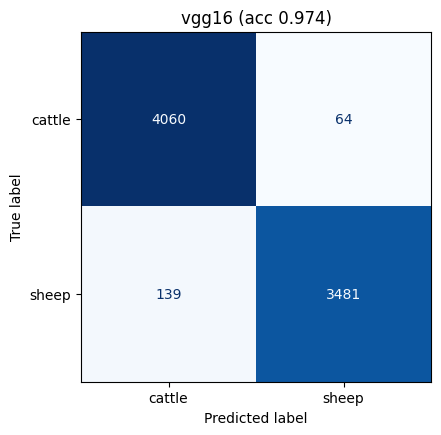


=== mobilenet_v2 ===
loading cached results and weights


mobilenet_v2 test: acc=0.9498 P=0.9496 R=0.9495 F1=0.9496


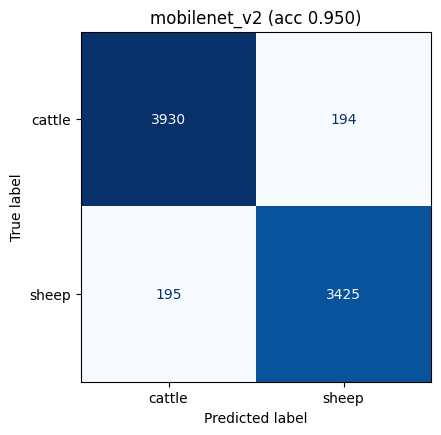

In [42]:
FINAL_EPOCHS = 10
criterion = nn.CrossEntropyLoss()

final_results = {}

for name, study in studies.items():
    print(f"\n=== {name} ===")
    run_dir = RUNS_BASE / name
    bp = study.best_params
    results_path = run_dir / "test_results.json"
    weights_path = run_dir / f"best_{name}.pt"

    if results_path.exists() and weights_path.exists():
        print(f"loading cached results and weights")
        with open(results_path) as f:
            result = json.load(f)
        model = MODEL_FACTORIES[name](dropout=bp["dropout"]).to(DEVICE)
        model.load_state_dict(torch.load(weights_path, map_location=DEVICE))
        ys = np.load(run_dir / "test_ys.npy")
        ps = np.load(run_dir / "test_ps.npy")
        test_acc = result["test_acc"]
        best_val = result["best_val_acc"]
        cm = np.array(result["confusion_matrix"])
    else:
        model = MODEL_FACTORIES[name](dropout=bp["dropout"]).to(DEVICE)
        optimizer = make_optimizer(bp["optimizer"], model.parameters(),
                                    bp["lr"], weight_decay=bp["weight_decay"])
        tr_loader = DataLoader(train_ds, batch_size=bp["batch_size"], shuffle=True, num_workers=0)
        val_loader = DataLoader(val_ds, batch_size=bp["batch_size"], shuffle=False, num_workers=0)
        t0 = time.time()
        history, best_state, best_val = fit_model(
            model, tr_loader, val_loader, FINAL_EPOCHS, optimizer, criterion, DEVICE,
            patience=4, verbose=True,
        )
        print(f"total final train time: {(time.time()-t0)/60:.1f} min")
        model.load_state_dict(best_state)
        torch.save(best_state, weights_path)

        test_loader = DataLoader(test_ds, batch_size=64, shuffle=False, num_workers=0)
        _, test_acc, ys, ps = evaluate(model, test_loader, criterion, DEVICE)
        p_macro = precision_score(ys, ps, average="macro")
        r_macro = recall_score(ys, ps, average="macro")
        f1_macro = f1_score(ys, ps, average="macro")
        cm = confusion_matrix(ys, ps)

        result = {
            "model": name,
            "best_val_acc": float(best_val),
            "test_acc": float(test_acc),
            "precision": float(p_macro),
            "recall": float(r_macro),
            "f1": float(f1_macro),
            "confusion_matrix": cm.tolist(),
            "best_params": bp,
            "n_params_total": sum(p.numel() for p in model.parameters()),
            "n_params_trainable": sum(p.numel() for p in model.parameters() if p.requires_grad),
        }
        with open(results_path, "w") as f:
            json.dump(result, f, indent=2)
        np.save(run_dir / "test_ys.npy", ys)
        np.save(run_dir / "test_ps.npy", ps)

    print(f"{name} test: acc={test_acc:.4f} P={result['precision']:.4f} R={result['recall']:.4f} F1={result['f1']:.4f}")

    fig, ax = plt.subplots(figsize=(4.5, 4.5))
    ConfusionMatrixDisplay(cm, display_labels=classes).plot(ax=ax, cmap="Blues", colorbar=False)
    ax.set_title(f"{name} (acc {test_acc:.3f})")
    plt.tight_layout()
    plt.savefig(run_dir / "confusion_matrix.png", dpi=100, bbox_inches="tight")
    plt.show()

    final_results[name] = {"test_acc": test_acc, "result": result, "model": model}

Grad-CAM rows for ResNet50, VGG16 and MobileNetV2 on the same 6 test images. Useful as a qualitative sanity check; the maps look quite different across backbones.

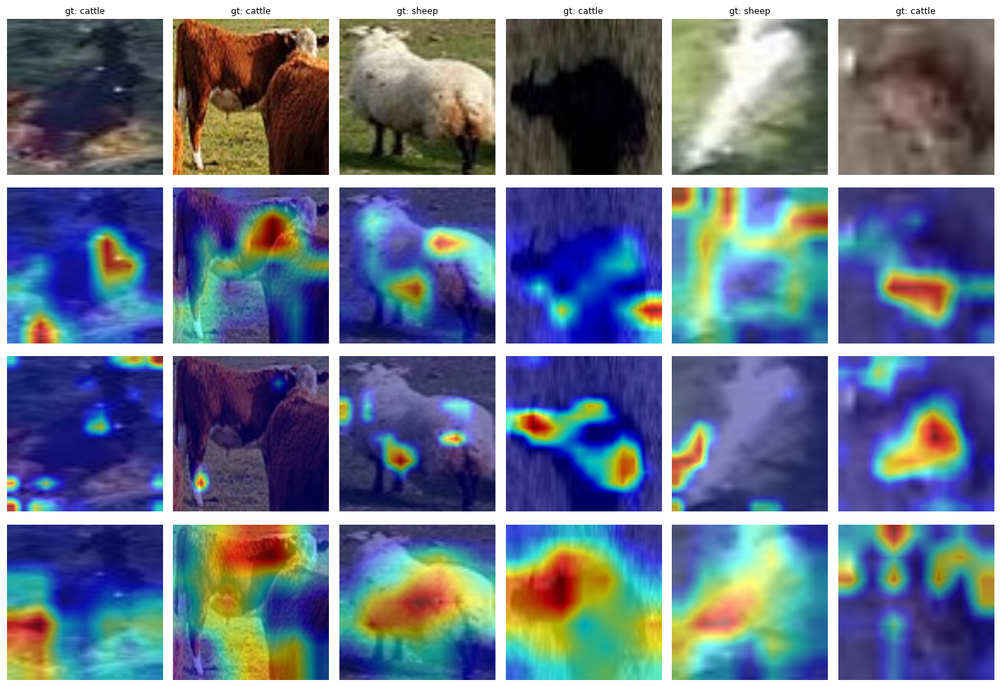

saved transfer_gradcam_grid.png


In [43]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image

GRAD_CAM_LAYER = {
    "resnet50": lambda m: [m.layer4[-1]],
    "vgg16": lambda m: [m.features[-3]],
    "mobilenet_v2": lambda m: [m.features[-1]],
}

n_samples = 6
sample_indices = np.random.RandomState(SEED).choice(len(test_ds), size=n_samples, replace=False)
mean_t = torch.tensor(IMAGENET_MEAN).view(3, 1, 1)
std_t = torch.tensor(IMAGENET_STD).view(3, 1, 1)

fig, axes = plt.subplots(4, n_samples, figsize=(n_samples * 2.4, 10))
for i, idx in enumerate(sample_indices):
    img_tensor, label = test_ds[idx]
    img_rgb = (img_tensor * std_t + mean_t).clamp(0, 1).permute(1, 2, 0).numpy()
    axes[0, i].imshow(img_rgb)
    axes[0, i].set_title(f"gt: {classes[label]}", fontsize=9)
    axes[0, i].axis("off")

for row_idx, name in enumerate(("resnet50", "vgg16", "mobilenet_v2")):
    model = final_results[name]["model"]
    for p in model.parameters():
        p.requires_grad_(True)
    model.eval()
    target_layers = GRAD_CAM_LAYER[name](model)
    cam = GradCAM(model=model, target_layers=target_layers)
    for i, idx in enumerate(sample_indices):
        img_tensor, label = test_ds[idx]
        img_rgb = (img_tensor * std_t + mean_t).clamp(0, 1).permute(1, 2, 0).numpy()
        grayscale = cam(input_tensor=img_tensor.unsqueeze(0).to(DEVICE))[0]
        viz = show_cam_on_image(img_rgb, grayscale, use_rgb=True)
        axes[row_idx + 1, i].imshow(viz)
        axes[row_idx + 1, i].axis("off")
        if i == 0:
            axes[row_idx + 1, 0].set_ylabel(name, rotation=90, labelpad=10)

plt.tight_layout()
plt.savefig(RUNS_BASE / "transfer_gradcam_grid.png", dpi=100, bbox_inches="tight")
plt.show()
print("saved transfer_gradcam_grid.png")

Comparison table: param counts, val acc and test metrics for the custom CNN baseline plus the three transfer models. Saved as CSV.

In [44]:
summary_rows = []
for name, r in final_results.items():
    res = r["result"]
    summary_rows.append({
        "model": name,
        "total_params": res["n_params_total"],
        "trainable_params": res["n_params_trainable"],
        "best_val_acc": round(res["best_val_acc"], 4),
        "test_acc": round(res["test_acc"], 4),
        "precision": round(res["precision"], 4),
        "recall": round(res["recall"], 4),
        "f1": round(res["f1"], 4),
    })

baseline_path = RUNS_BASE / "baseline_cnn" / "test_results.json"
if baseline_path.exists():
    with open(baseline_path) as f:
        baseline = json.load(f)
    summary_rows.insert(0, {
        "model": "custom_cnn",
        "total_params": 8760706,
        "trainable_params": 8760706,
        "best_val_acc": round(baseline["best_val_acc"], 4),
        "test_acc": round(baseline["test_acc"], 4),
        "precision": round(baseline["precision"], 4),
        "recall": round(baseline["recall"], 4),
        "f1": round(baseline["f1"], 4),
    })

comp_df = pd.DataFrame(summary_rows)
print("classifier comparison (baseline + transfer):")
print(comp_df.to_string(index=False))

comp_df.to_csv(RUNS_BASE / "classification_comparison.csv", index=False)
print("saved", RUNS_BASE / "classification_comparison.csv")

classification models comparison (custom CNN baseline + transfer learning):

       model  total_params  trainable_params  best_val_acc  test_acc  precision  recall     f1
  custom_cnn       8760706           8760706        0.9609    0.9610     0.9610  0.9606 0.9608
    resnet50      23770562            262530        0.9565    0.9570     0.9567  0.9570 0.9568
       vgg16      17926338           3211650        0.9722    0.9738     0.9744  0.9730 0.9736
mobilenet_v2       2388098            164226        0.9484    0.9498     0.9496  0.9495 0.9496

saved /Users/m/Documents/capstone-msc-da-feb-25-cohort-MeerimZhenisbekova/runs/classification_comparison.csv


## Phase 6: YOLOv8n for detection and counting

I switch from per-crop classification to full-image detection. YOLOv8n is the smallest variant: fast and good enough for a baseline counting model. I write a `data.yaml` for the processed split, train (or load cached weights), evaluate detection metrics on test, and then run inference image by image to get counts. The counting numbers (MAE, RMSE, R^2) are what I will compare against ground truth crowd sizes.

Setup for YOLO. I install Ultralytics if it is missing, set up Kaggle vs local paths, and write the `data.yaml` that points at the processed train/val/test folders. Batch and epoch budgets are smaller locally than on Kaggle.

In [45]:
import sys
import subprocess
try:
    import ultralytics
except ImportError:
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "-U", "ultralytics"])

import os
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"

from pathlib import Path
import json
import time

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import torch
import yaml
from ultralytics import YOLO

KAGGLE = Path("/kaggle/input").exists()

if KAGGLE:
    candidates = list(Path("/kaggle/input").rglob("processed/images/train"))
    if not candidates:
        candidates = list(Path("/kaggle/input").rglob("images/train"))
    DATA_ROOT = candidates[0].parent.parent
    RUNS_DIR = Path("/kaggle/working/runs/yolov8")
    DEVICE = 0
    BATCH = 32
    EPOCHS = 30
else:
    PROJECT_ROOT = Path.cwd()
    if PROJECT_ROOT.name == "notebooks":
        PROJECT_ROOT = PROJECT_ROOT.parent
    DATA_ROOT = PROJECT_ROOT / "data" / "processed"
    RUNS_DIR = PROJECT_ROOT / "runs" / "yolov8"
    DEVICE = "cpu"
    BATCH = 8
    EPOCHS = 20

RUNS_DIR.mkdir(parents=True, exist_ok=True)

SEED = 42
IMG_SIZE = 640

DATA_YAML = RUNS_DIR / "data.yaml"
yaml_content = {
    "path": str(DATA_ROOT.resolve()),
    "train": "images/train",
    "val": "images/val",
    "test": "images/test",
    "names": {0: "cattle", 1: "sheep"},
}
with open(DATA_YAML, "w") as f:
    yaml.safe_dump(yaml_content, f, sort_keys=False)

print("kaggle:", KAGGLE)
print("data root:", DATA_ROOT)
print("runs dir:", RUNS_DIR)
print("device:", DEVICE)
print("batch:", BATCH, "epochs:", EPOCHS, "img:", IMG_SIZE)
print("data yaml:", DATA_YAML)

kaggle: True
data root: /kaggle/input/datasets/jazzyflavor/livestock-yolo-processed/processed
runs dir: /kaggle/working/runs/yolov8
device: 0
batch: 32 epochs: 30 img: 640
data yaml: /kaggle/working/runs/yolov8/data.yaml


Train YOLOv8n. If `best.pt` already exists I skip training and just reload, same caching idea as in Phase 5. Patience 6 for early stopping.

In [46]:
best_pt = RUNS_DIR / "train" / "weights" / "best.pt"
if best_pt.exists():
    print(f"loading existing weights from {best_pt}")
    model = YOLO(str(best_pt))
    train_results = None
else:
    print("training yolov8n")
    model = YOLO("yolov8n.pt")
    t0 = time.time()
    train_results = model.train(
        data=str(DATA_YAML),
        epochs=EPOCHS,
        imgsz=IMG_SIZE,
        batch=BATCH,
        patience=6,
        device=DEVICE,
        project=str(RUNS_DIR),
        name="train",
        seed=SEED,
        deterministic=True,
        verbose=True,
        plots=True,
        save=True,
        workers=2,
    )
    print(f"\ntrain time: {(time.time()-t0)/60:.1f} min")

print("ok")

training yolov8n from scratch
Ultralytics 8.4.42 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/runs/yolov8/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=aut

Detection metrics on the test split: mAP@50, mAP@50-95, precision, recall, plus per-class AP for cattle and sheep.

In [47]:
val_metrics = model.val(
    data=str(DATA_YAML),
    split="test",
    imgsz=IMG_SIZE,
    batch=BATCH,
    device=DEVICE,
    project=str(RUNS_DIR),
    name="val_test",
    exist_ok=True,
    plots=True,
    verbose=True,
)

print("test detection metrics:")
print(f"  mAP@50: {val_metrics.box.map50:.4f}")
print(f"  mAP@50-95: {val_metrics.box.map:.4f}")
print(f"  precision: {val_metrics.box.mp:.4f}")
print(f"  recall: {val_metrics.box.mr:.4f}")
print("per-class:")
for i, cls_name in enumerate(["cattle", "sheep"]):
    print(f"  {cls_name}: AP50={val_metrics.box.ap50[i]:.4f} AP50-95={val_metrics.box.ap[i]:.4f}")

detection_results = {
    "map50": float(val_metrics.box.map50),
    "map": float(val_metrics.box.map),
    "precision": float(val_metrics.box.mp),
    "recall": float(val_metrics.box.mr),
    "per_class": {
        "cattle": {"ap50": float(val_metrics.box.ap50[0]), "ap": float(val_metrics.box.ap[0])},
        "sheep":  {"ap50": float(val_metrics.box.ap50[1]), "ap": float(val_metrics.box.ap[1])},
    },
}

Ultralytics 8.4.42 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 16.6±8.4 MB/s, size: 129.6 KB)
val: Scanning /kaggle/input/datasets/jazzyflavor/livestock-yolo-processed/processed/labels/test... 1835 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1835/1835 153.4it/s 12.0s0.1s
WARNING ⚠️ val: Cache directory /kaggle/input/datasets/jazzyflavor/livestock-yolo-processed/processed/labels is not writable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 58/58 3.3it/s 17.5s0.3s
                   all       1835      31318      0.951      0.901      0.948      0.601
                cattle        995      11042      0.952      0.879      0.943      0.617
                 sheep        855      20276      0.951      0.924      0.953      0.585
Speed: 1.1ms preprocess, 3.7

Per-image inference loop for counting. I predict on every test image, count predicted boxes, count ground-truth boxes from the label files, and store both. A few sample predictions are kept for plotting later. I had to call `gc.collect()` and clear the CUDA cache periodically: without that it ran out of memory on long runs.

In [48]:
import gc

test_imgs_dir = DATA_ROOT / "images" / "test"
test_lbls_dir = DATA_ROOT / "labels" / "test"

test_images = sorted([p for p in test_imgs_dir.glob("*") if p.suffix.lower() in (".jpg", ".jpeg", ".png")])
print(f"test images: {len(test_images)}")

def gt_count(img_path):
    lbl = test_lbls_dir / (img_path.stem + ".txt")
    if not lbl.exists():
        return 0
    return sum(1 for line in lbl.read_text().strip().splitlines() if line.strip())

gc.collect()
torch.cuda.empty_cache()
print(f"gpu mem before predict: {torch.cuda.memory_allocated()/1024**3:.2f} GiB allocated")

print("inference, image by image")
t0 = time.time()

sample_indices = set(np.random.RandomState(SEED).choice(len(test_images), size=6, replace=False).tolist())
sample_results = {}
count_rows = []

for i, img_path in enumerate(test_images):
    r = model.predict(
        source=str(img_path),
        imgsz=416,
        device=DEVICE,
        conf=0.25,
        iou=0.45,
        verbose=False,
    )[0]
    gt = gt_count(img_path)
    pred = len(r.boxes) if r.boxes is not None else 0
    count_rows.append({
        "image_id": img_path.name,
        "gt_count": gt,
        "pred_count": pred,
    })
    if i in sample_indices:
        sample_results[i] = r.cpu()
    if i % 200 == 0 and i > 0:
        torch.cuda.empty_cache()
        elapsed = time.time() - t0
        print(f"  {i}/{len(test_images)} done, {elapsed:.0f}s")

print(f"inference time: {(time.time()-t0)/60:.1f} min")

count_df = pd.DataFrame(count_rows)
print(count_df[["gt_count", "pred_count"]].describe())

test images: 1835
gpu mem before predict: 2.19 GiB allocated
running inference one image at a time...
  200/1835 done, 4s
  400/1835 done, 9s
  600/1835 done, 14s
  800/1835 done, 18s
  1000/1835 done, 22s
  1200/1835 done, 26s
  1400/1835 done, 30s
  1600/1835 done, 35s
  1800/1835 done, 39s
inference time: 0.7 min

          gt_count   pred_count
count  1835.000000  1835.000000
mean     17.067030    15.822343
std      20.334348    19.193869
min       1.000000     0.000000
25%       5.000000     4.000000
50%      11.000000    10.000000
75%      19.000000    19.000000
max     105.000000   101.000000


Counting metrics: MAE, RMSE, R^2, plus the share of images where the model exact-matched, undercounted, or overcounted. These regression metrics are how I measure how good YOLO is as a counter, beyond raw detection mAP.

In [49]:
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error

mae = mean_absolute_error(count_df["gt_count"], count_df["pred_count"])
mse = mean_squared_error(count_df["gt_count"], count_df["pred_count"])
rmse = np.sqrt(mse)
r2 = r2_score(count_df["gt_count"], count_df["pred_count"])
under_count = (count_df["pred_count"] < count_df["gt_count"]).sum()
over_count = (count_df["pred_count"] > count_df["gt_count"]).sum()
exact_match = (count_df["pred_count"] == count_df["gt_count"]).sum()

print("counting metrics on test:")
print(f"  MAE: {mae:.3f}")
print(f"  RMSE: {rmse:.3f}")
print(f"  R^2: {r2:.4f}")
print(f"  exact match: {exact_match} ({100*exact_match/len(count_df):.1f}%)")
print(f"  undercount: {under_count} ({100*under_count/len(count_df):.1f}%)")
print(f"  overcount: {over_count} ({100*over_count/len(count_df):.1f}%)")

counting_results = {
    "mae": float(mae),
    "rmse": float(rmse),
    "r2": float(r2),
    "exact_match_pct": float(100 * exact_match / len(count_df)),
    "undercount_pct": float(100 * under_count / len(count_df)),
    "overcount_pct": float(100 * over_count / len(count_df)),
    "n_test_images": int(len(count_df)),
}

counting metrics on test split:
  MAE:       1.576
  RMSE:      3.218
  R^2:       0.9749
  exact match: 857 (46.7%)
  undercount:  768 (41.9%)
  overcount:   210 (11.4%)


Two plots: predicted vs ground truth count scatter (with y=x line for reference) and the histogram of counting errors. Visual check on whether YOLO systematically under- or over-counts.

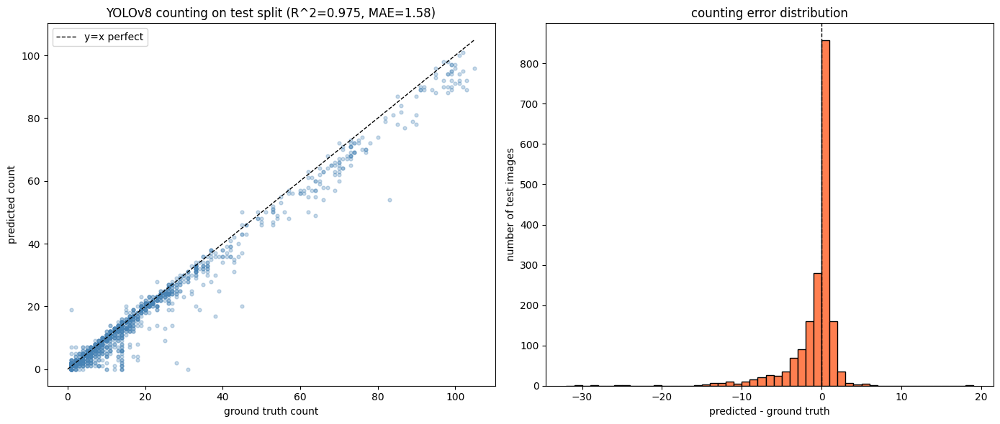

In [50]:
max_count = max(count_df["gt_count"].max(), count_df["pred_count"].max())

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

axes[0].scatter(count_df["gt_count"], count_df["pred_count"], alpha=0.3, s=12, color="steelblue")
axes[0].plot([0, max_count], [0, max_count], "k--", linewidth=1, label="y=x perfect")
axes[0].set_xlabel("ground truth count")
axes[0].set_ylabel("predicted count")
axes[0].set_title(f"YOLOv8 counting on test split (R^2={r2:.3f}, MAE={mae:.2f})")
axes[0].legend()

errors = count_df["pred_count"] - count_df["gt_count"]
axes[1].hist(errors, bins=range(int(errors.min()) - 1, int(errors.max()) + 2), color="coral", edgecolor="black")
axes[1].axvline(0, color="black", linestyle="--", linewidth=1)
axes[1].set_xlabel("predicted - ground truth")
axes[1].set_ylabel("number of test images")
axes[1].set_title("counting error distribution")

plt.tight_layout()
plt.savefig(RUNS_DIR / "counting_scatter.png", dpi=100, bbox_inches="tight")
plt.show()

A 2x3 grid of detection samples with predicted boxes drawn on, with `gt` and `pred` counts in the title. Just to see what the predictions actually look like.

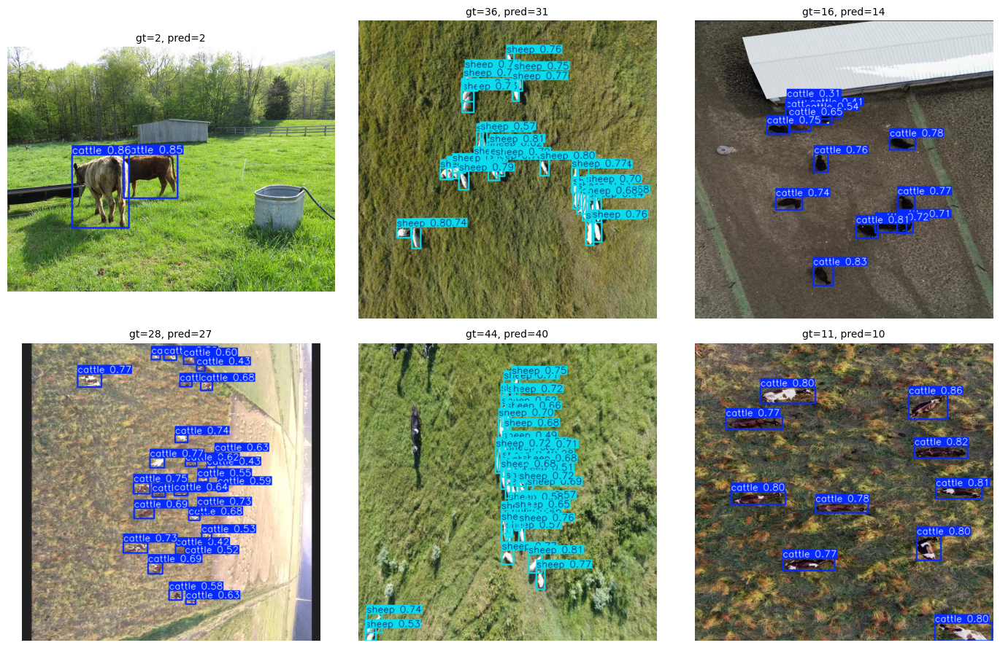

In [51]:
fig, axes = plt.subplots(2, 3, figsize=(14, 9))
axes = axes.flatten()
for i, idx in enumerate(sorted(sample_indices)):
    r = sample_results[idx]
    plotted = r.plot()
    axes[i].imshow(plotted[..., ::-1])
    gt = count_df.iloc[idx]["gt_count"]
    pred = count_df.iloc[idx]["pred_count"]
    axes[i].set_title(f"gt={gt}, pred={pred}", fontsize=10)
    axes[i].axis("off")
plt.tight_layout()
plt.savefig(RUNS_DIR / "detection_samples.png", dpi=100, bbox_inches="tight")
plt.show()

Save all YOLO results to JSON and the per-image counts to CSV. Plus a short text summary and a list of all saved artefacts under the YOLO runs folder.

In [52]:
all_results = {
    "model": "yolov8n",
    "img_size": IMG_SIZE,
    "epochs": EPOCHS,
    "batch": BATCH,
    "kaggle": KAGGLE,
    "detection": detection_results,
    "counting": counting_results,
}

with open(RUNS_DIR / "test_results.json", "w") as f:
    json.dump(all_results, f, indent=2)

count_df.to_csv(RUNS_DIR / "test_counts.csv", index=False)

print("--- yolov8 summary ---")
print(f"det mAP@50: {detection_results['map50']:.4f}")
print(f"det mAP@50-95: {detection_results['map']:.4f}")
print(f"count MAE: {counting_results['mae']:.3f}")
print(f"count R^2: {counting_results['r2']:.4f}")
print(f"saved: {RUNS_DIR / 'test_results.json'}")
print(f"saved: {RUNS_DIR / 'test_counts.csv'}")
print("artifacts:")
for p in sorted(RUNS_DIR.rglob("*")):
    if p.is_file():
        size = p.stat().st_size / 1024
        unit = "KB" if size < 1024 else "MB"
        if size >= 1024:
            size = size / 1024
        print(f"  {p.relative_to(RUNS_DIR)}: {size:.1f} {unit}")

yolov8 summary

detection mAP@50:    0.9478
detection mAP@50-95: 0.6007
counting MAE:        1.576
counting R^2:        0.9749

saved: /kaggle/working/runs/yolov8/test_results.json
saved: /kaggle/working/runs/yolov8/test_counts.csv

artifacts:
  counting_scatter.png: 79.4 KB
  data.yaml: 0.2 KB
  detection_samples.png: 2.1 MB
  test_counts.csv: 37.8 KB
  test_results.json: 0.7 KB
  train/BoxF1_curve.png: 139.3 KB
  train/BoxPR_curve.png: 108.6 KB
  train/BoxP_curve.png: 109.5 KB
  train/BoxR_curve.png: 138.0 KB
  train/args.yaml: 1.6 KB
  train/confusion_matrix.png: 131.2 KB
  train/confusion_matrix_normalized.png: 113.8 KB
  train/labels.jpg: 188.7 KB
  train/results.csv: 3.8 KB
  train/results.png: 287.0 KB
  train/train_batch0.jpg: 739.2 KB
  train/train_batch1.jpg: 709.8 KB
  train/train_batch2.jpg: 786.3 KB
  train/train_batch5360.jpg: 658.7 KB
  train/train_batch5361.jpg: 632.9 KB
  train/train_batch5362.jpg: 613.3 KB
  train/val_batch0_labels.jpg: 466.8 KB
  train/val_batch0_pre

## Phase 7: cross-model comparison and hypothesis tests

I bring everything together: load test predictions from all four classifiers and the YOLO results, build comparison tables, plot confusion matrices side by side, run pairwise McNemar tests on the classifiers, slice accuracy by lighting and occlusion subgroups, and then run my two formal hypotheses (H1: pretrained > custom CNN; H2: augmentation helps generalisation). The final cell prints a clean summary I can drop straight into the report.

Imports and config for the comparison section. Lists the classifier names and where their saved results live. Also loads the YOLO results path.

In [53]:
from pathlib import Path
import json

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score,
                             confusion_matrix, ConfusionMatrixDisplay,
                             mean_absolute_error)
from statsmodels.stats.contingency_tables import mcnemar
from torchvision.datasets import ImageFolder

PROJECT_ROOT = Path.cwd()
if PROJECT_ROOT.name == "notebooks":
    PROJECT_ROOT = PROJECT_ROOT.parent

RUNS_BASE = PROJECT_ROOT / "runs"
DATA_CROPS = PROJECT_ROOT / "data" / "crops"
DATA_PROCESSED = PROJECT_ROOT / "data" / "processed"

CLASSIFIERS = ["custom_cnn", "resnet50", "vgg16", "mobilenet_v2"]
RUN_DIRS = {
    "custom_cnn": RUNS_BASE / "baseline_cnn",
    "resnet50": RUNS_BASE / "resnet50",
    "vgg16": RUNS_BASE / "vgg16",
    "mobilenet_v2": RUNS_BASE / "mobilenet_v2",
}
classes = ["cattle", "sheep"]

pd.set_option("display.max_columns", None)
plt.rcParams["figure.figsize"] = (10, 5)

print("project root:", PROJECT_ROOT)
print("classifiers:", CLASSIFIERS)

project root: /Users/m/Documents/capstone-msc-da-feb-25-cohort-MeerimZhenisbekova
classifiers: ['custom_cnn', 'resnet50', 'vgg16', 'mobilenet_v2']


Load each classifier's `test_results.json` plus saved `y_true`/`y_pred` arrays. I assert that y_true is identical across models so McNemar is valid. Also load the YOLO results JSON.

In [54]:
results = {}
ys_dict = {}
ps_dict = {}

for name in CLASSIFIERS:
    run_dir = RUN_DIRS[name]
    with open(run_dir / "test_results.json") as f:
        results[name] = json.load(f)
    ys_dict[name] = np.load(run_dir / "test_ys.npy")
    ps_dict[name] = np.load(run_dir / "test_ps.npy")

ref_ys = ys_dict[CLASSIFIERS[0]]
for name in CLASSIFIERS[1:]:
    assert np.array_equal(ref_ys, ys_dict[name]), f"test ys mismatch for {name}"
y_true = ref_ys

with open(RUNS_BASE / "yolov8" / "test_results.json") as f:
    yolo = json.load(f)

print(f"clf test crops: {len(y_true)}")
print(f"yolo test imgs: {yolo['counting']['n_test_images']}")
print("loaded models:", list(results.keys()) + ["yolov8"])

test set size (classifier crops): 7744
yolo test set size (full images): 1835

loaded models: ['custom_cnn', 'resnet50', 'vgg16', 'mobilenet_v2', 'yolov8']


Side-by-side classifier comparison table (acc, P, R, F1, params) and a summary block for YOLO covering both detection metrics and counting metrics.

In [55]:
rows = []
for name in CLASSIFIERS:
    r = results[name]
    rows.append({
        "model": name,
        "test_acc": r["test_acc"],
        "precision": r["precision"],
        "recall": r["recall"],
        "f1": r["f1"],
        "params": r.get("n_params_total", 8760706),
    })
clf_table = pd.DataFrame(rows)
print("classifier comparison")
print(clf_table.to_string(index=False))

print("yolov8 (detection + counting, separate space)")
print(f"  mAP@50: {yolo['detection']['map50']:.4f}")
print(f"  mAP@50-95: {yolo['detection']['map']:.4f}")
print(f"  precision: {yolo['detection']['precision']:.4f}")
print(f"  recall: {yolo['detection']['recall']:.4f}")
print(f"  count MAE: {yolo['counting']['mae']:.3f}")
print(f"  count RMSE: {yolo['counting']['rmse']:.3f}")
print(f"  count R^2: {yolo['counting']['r2']:.4f}")
print(f"  exact match: {yolo['counting']['exact_match_pct']:.1f}%")

classification models comparison
       model  test_acc  precision   recall       f1   params
  custom_cnn  0.961002   0.961025 0.960634 0.960820  8760706
    resnet50  0.956999   0.956672 0.957010 0.956832 23770562
       vgg16  0.973786   0.974422 0.973042 0.973639 17926338
mobilenet_v2  0.949768   0.949561 0.949545 0.949553  2388098

yolov8 (detection + counting, separate measurement space)
  mAP@50:         0.9478
  mAP@50-95:      0.6007
  precision:      0.9514
  recall:         0.9011
  counting MAE:   1.576
  counting RMSE:  3.218
  counting R^2:   0.9749
  exact match:    46.7%


Confusion matrices for all four classifiers on one row, with each model's test acc in the title.

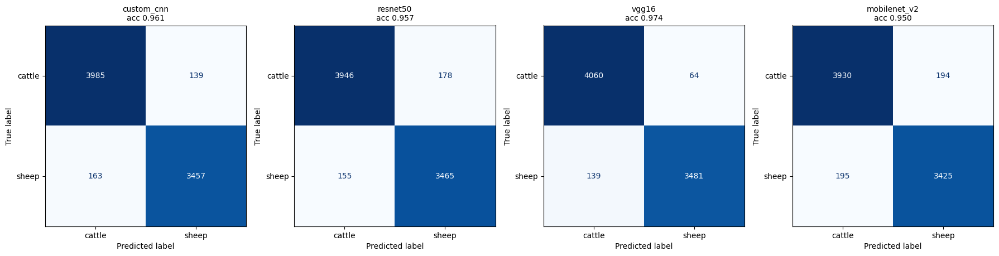

In [56]:
fig, axes = plt.subplots(1, 4, figsize=(18, 4.5))
for ax, name in zip(axes, CLASSIFIERS):
    cm = np.array(results[name]["confusion_matrix"])
    ConfusionMatrixDisplay(cm, display_labels=classes).plot(ax=ax, cmap="Blues", colorbar=False)
    ax.set_title(f"{name}\nacc {results[name]['test_acc']:.3f}", fontsize=10)
plt.tight_layout()
plt.savefig(RUNS_BASE / "all_confusion_matrices.png", dpi=100, bbox_inches="tight")
plt.show()

McNemar test for every pair of classifiers. The test is on whether two models make significantly different errors on the same test set. I print a p-value matrix and a sentence-per-pair interpretation with the better-performing model called out.

In [57]:
def mcnemar_pvalue(y_true_arr, y_a, y_b):
    a_correct = y_a == y_true_arr
    b_correct = y_b == y_true_arr
    table = [
        [int((a_correct & b_correct).sum()),  int((a_correct & ~b_correct).sum())],
        [int((~a_correct & b_correct).sum()), int((~a_correct & ~b_correct).sum())],
    ]
    return mcnemar(table, exact=False, correction=True).pvalue, table

print("mcnemar pairwise (H0: same error rate; p<0.05 = different)")
n = len(CLASSIFIERS)
p_matrix = pd.DataFrame(np.full((n, n), np.nan), index=CLASSIFIERS, columns=CLASSIFIERS)
for i, a in enumerate(CLASSIFIERS):
    for j, b in enumerate(CLASSIFIERS):
        if i < j:
            p_val, _ = mcnemar_pvalue(y_true, ps_dict[a], ps_dict[b])
            p_matrix.iloc[i, j] = p_val

print("p-values (upper triangle):")
print(p_matrix.round(6).to_string())

print("interpretation:")
for i, a in enumerate(CLASSIFIERS):
    for j, b in enumerate(CLASSIFIERS):
        if i < j:
            p_val = p_matrix.iloc[i, j]
            verdict = "DIFFERENT" if p_val < 0.05 else "no significant diff"
            acc_a = results[a]["test_acc"]
            acc_b = results[b]["test_acc"]
            winner = a if acc_a > acc_b else b
            print(f"  {a} vs {b}: p={p_val:.4e} -> {verdict}  (better: {winner})")

McNemar test pairwise (H0: same error rate; p < 0.05 = significant difference)

p-values (upper triangle):
              custom_cnn  resnet50  vgg16  mobilenet_v2
custom_cnn           NaN  0.147501    0.0      0.000047
resnet50             NaN       NaN    0.0      0.009049
vgg16                NaN       NaN    NaN      0.000000
mobilenet_v2         NaN       NaN    NaN           NaN

interpretation:
  custom_cnn vs resnet50: p=1.4750e-01 -> no significant diff  (better: custom_cnn)
  custom_cnn vs vgg16: p=2.7434e-08 -> DIFFERENT  (better: vgg16)
  custom_cnn vs mobilenet_v2: p=4.7488e-05 -> DIFFERENT  (better: custom_cnn)
  resnet50 vs vgg16: p=1.2010e-11 -> DIFFERENT  (better: vgg16)
  resnet50 vs mobilenet_v2: p=9.0493e-03 -> DIFFERENT  (better: resnet50)
  vgg16 vs mobilenet_v2: p=1.4194e-21 -> DIFFERENT  (better: vgg16)


I match each test crop back to its source image so I can attach the lighting/occlusion subgroup label from preprocessing. There are usually a handful of crops with `unknown` subgroups when the source image cannot be matched, so I print the count for a sanity check.

In [58]:
test_ds_meta = ImageFolder(DATA_CROPS / "test")
test_filenames = [Path(p).name for p, _ in test_ds_meta.samples]
print("test crops:", len(test_filenames))

def crop_to_image(crop_name):
    stem = Path(crop_name).stem
    parts = stem.rsplit("_", 1)
    return parts[0] + ".jpg"

subgroup_df = pd.read_csv(DATA_PROCESSED / "subgroup_labels.csv")
img_to_lighting = dict(zip(subgroup_df["image_id"], subgroup_df["lighting"]))
img_to_occlusion = dict(zip(subgroup_df["image_id"], subgroup_df["occlusion"]))

result_df = pd.DataFrame({
    "filename": test_filenames,
    "y_true": y_true,
    "lighting": [img_to_lighting.get(crop_to_image(f), "unknown") for f in test_filenames],
    "occlusion": [img_to_occlusion.get(crop_to_image(f), "unknown") for f in test_filenames],
})
for name in CLASSIFIERS:
    result_df[f"y_{name}"] = ps_dict[name]
    result_df[f"correct_{name}"] = (ps_dict[name] == y_true).astype(int)

print("subgroup distribution in test crops:")
print(f"  lighting:  {result_df['lighting'].value_counts().to_dict()}")
print(f"  occlusion: {result_df['occlusion'].value_counts().to_dict()}")
unknown_n = (result_df["lighting"] == "unknown").sum()
if unknown_n > 0:
    print(f"  WARNING: {unknown_n} crops with unknown subgroup (image not found in subgroup_labels)")

test crops in alphabetic order: 7744

subgroup distribution in test crops:
  lighting:  {'overcast': 6036, 'dim': 879, 'bright': 829}
  occlusion: {'low': 3663, 'high': 2066, 'medium': 2015}


Per-subgroup accuracy tables for lighting and occlusion, one column per classifier. Heatmaps make it easy to see which model degrades most on dim images or high-occlusion crowds.

per-subgroup classification accuracy

=== lighting ===
          custom_cnn  resnet50   vgg16  mobilenet_v2
lighting                                            
bright        0.9602    0.9517  0.9723        0.9180
dim           0.9693    0.9750  0.9784        0.9579
overcast      0.9599    0.9551  0.9733        0.9529

=== occlusion ===
           custom_cnn  resnet50   vgg16  mobilenet_v2
occlusion                                            
high           0.9603    0.9705  0.9724        0.9584
low            0.9689    0.9544  0.9776        0.9552
medium         0.9474    0.9479  0.9682        0.9310


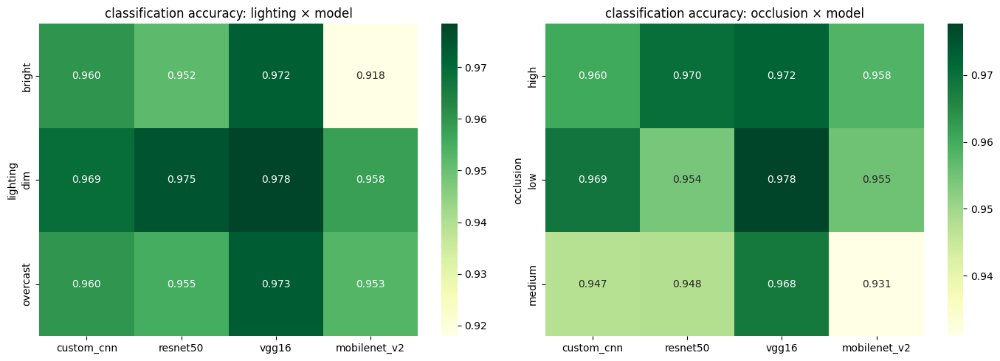

In [59]:
ltable = pd.DataFrame({
    name: result_df.groupby("lighting")[f"correct_{name}"].mean()
    for name in CLASSIFIERS
})
otable = pd.DataFrame({
    name: result_df.groupby("occlusion")[f"correct_{name}"].mean()
    for name in CLASSIFIERS
})

print("per-subgroup clf accuracy")
print("# lighting")
print(ltable.round(4).to_string())
print("# occlusion")
print(otable.round(4).to_string())

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
sns.heatmap(ltable, annot=True, fmt=".3f", cmap="YlGn", ax=axes[0])
axes[0].set_title("classification accuracy: lighting × model")
sns.heatmap(otable, annot=True, fmt=".3f", cmap="YlGn", ax=axes[1])
axes[1].set_title("classification accuracy: occlusion × model")
plt.tight_layout()
plt.savefig(RUNS_BASE / "subgroup_heatmaps.png", dpi=100, bbox_inches="tight")
plt.show()

Same subgroup analysis but for YOLO. I label each test image with lighting and occlusion (using the same rules as in preprocessing), then I compute mean counting MAE per subgroup. This is the closest I get to a fair comparison between classification accuracy and detection counting under the same conditions.

yolov8 counting MAE by subgroup

=== lighting ===
           mean  median  count
lighting                      
bright    2.107     1.0    196
dim       0.932     0.0    206
overcast  1.596     1.0   1433

=== occlusion ===
            mean  median  count
occlusion                      
high       3.559     2.0    433
low        0.650     0.0    960
medium     1.645     1.0    442


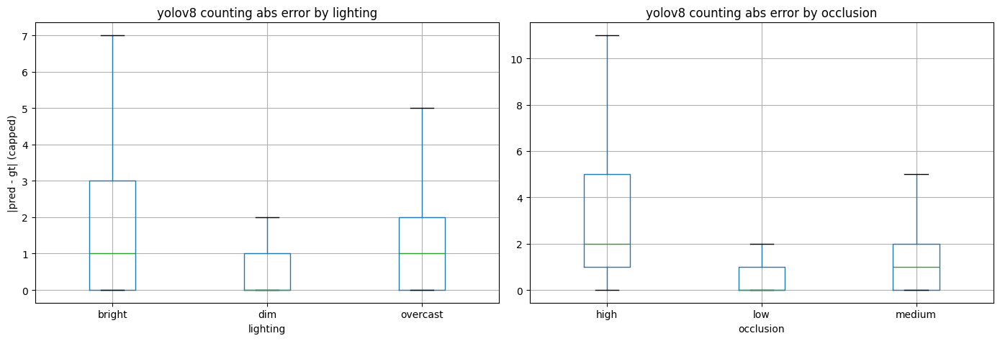

In [60]:
import cv2

YOLO_TEST_IMG_DIR = DATA_PROCESSED / "images" / "test"
YOLO_TEST_LBL_DIR = DATA_PROCESSED / "labels" / "test"

def lighting_for(img_path):
    bgr = cv2.imread(str(img_path))
    if bgr is None:
        return "unknown"
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    hsv = cv2.cvtColor(rgb, cv2.COLOR_RGB2HSV)
    v = hsv[..., 2].mean() / 255.0
    if v < 0.35:
        return "dim"
    if v < 0.65:
        return "overcast"
    return "bright"

def box_iou_yolo(a, b):
    ax1, ay1, ax2, ay2 = a
    bx1, by1, bx2, by2 = b
    ix1, iy1 = max(ax1, bx1), max(ay1, by1)
    ix2, iy2 = min(ax2, bx2), min(ay2, by2)
    iw, ih = max(0.0, ix2 - ix1), max(0.0, iy2 - iy1)
    inter = iw * ih
    area_a = max(0.0, ax2 - ax1) * max(0.0, ay2 - ay1)
    area_b = max(0.0, bx2 - bx1) * max(0.0, by2 - by1)
    union = area_a + area_b - inter
    return inter / union if union > 0 else 0.0

def occlusion_for(image_name):
    lbl = YOLO_TEST_LBL_DIR / (Path(image_name).stem + ".txt")
    if not lbl.exists():
        return "low"
    boxes = []
    for line in lbl.read_text().strip().splitlines():
        parts = line.split()
        if len(parts) >= 5:
            cx, cy, w, h = map(float, parts[1:5])
            boxes.append((cx - w/2, cy - h/2, cx + w/2, cy + h/2))
    if len(boxes) < 2:
        return "low"
    max_iou = 0.0
    for i in range(len(boxes)):
        for j in range(i + 1, len(boxes)):
            max_iou = max(max_iou, box_iou_yolo(boxes[i], boxes[j]))
    if max_iou < 0.1:
        return "low"
    if max_iou < 0.3:
        return "medium"
    return "high"

yolo_counts = pd.read_csv(RUNS_BASE / "yolov8" / "test_counts.csv")
yolo_counts["lighting"]  = [lighting_for(YOLO_TEST_IMG_DIR / name) for name in yolo_counts["image_id"]]
yolo_counts["occlusion"] = [occlusion_for(name) for name in yolo_counts["image_id"]]
yolo_counts["abs_err"]   = (yolo_counts["pred_count"] - yolo_counts["gt_count"]).abs()

print("yolov8 counting MAE by subgroup")
print("# lighting")
print(yolo_counts.groupby("lighting")["abs_err"].agg(["mean", "median", "count"]).round(3).to_string())
print("# occlusion")
print(yolo_counts.groupby("occlusion")["abs_err"].agg(["mean", "median", "count"]).round(3).to_string())

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
yolo_counts.boxplot(column="abs_err", by="lighting", ax=axes[0], showfliers=False)
axes[0].set_title("yolov8 counting abs error by lighting")
axes[0].set_xlabel("lighting")
axes[0].set_ylabel("|pred - gt| (capped)")
yolo_counts.boxplot(column="abs_err", by="occlusion", ax=axes[1], showfliers=False)
axes[1].set_title("yolov8 counting abs error by occlusion")
axes[1].set_xlabel("occlusion")
plt.suptitle("")
plt.tight_layout()
plt.savefig(RUNS_BASE / "yolo_subgroup_counting.png", dpi=100, bbox_inches="tight")
plt.show()

Hypothesis tests. H1: do the pretrained models beat the custom CNN with statistical significance? Loop over the three pretrained models, compute deltas and McNemar p-values, and conclude. H2: does augmentation help? Compare the custom CNN's test accuracy with and without augmentation using the ablation results saved in Phase 4.

In [61]:
print("--- hypothesis tests ---")

custom_acc = results["custom_cnn"]["test_acc"]

print("h1: pretrained > custom cnn?")
print(f"  custom cnn acc: {custom_acc:.4f}")
better_count = 0
for pret in ("resnet50", "vgg16", "mobilenet_v2"):
    pret_acc = results[pret]["test_acc"]
    delta = pret_acc - custom_acc
    p_val, _ = mcnemar_pvalue(y_true, ps_dict["custom_cnn"], ps_dict[pret])
    sig = "* significant" if p_val < 0.05 else "  not significant"
    print(f"  {pret}: acc={pret_acc:.4f}, delta={delta:+.4f}, McNemar p={p_val:.4e} {sig}")
    if pret_acc > custom_acc and p_val < 0.05:
        better_count += 1

if better_count == 3:
    h1 = "SUPPORTED (all 3 pretrained beat custom CNN significantly)"
elif better_count == 0:
    h1 = "REJECTED (no pretrained model significantly outperforms custom CNN)"
else:
    h1 = f"PARTIALLY SUPPORTED ({better_count}/3 pretrained beat custom CNN significantly)"
print(f"  H1 conclusion: {h1}")

print("h2: aug helps generalization?")
with open(RUNS_BASE / "baseline_cnn" / "ablation_results.json") as f:
    ablation = json.load(f)
print(f"  with aug: test = {custom_acc:.4f}")
print(f"  no aug:   test = {ablation['test_acc']:.4f}")
delta_aug = custom_acc - ablation["test_acc"]
print(f"  delta: {delta_aug:+.4f}")
if delta_aug > 0:
    h2 = f"SUPPORTED (augmentation gives +{delta_aug*100:.2f}pp accuracy)"
else:
    h2 = "REJECTED (augmentation does not help on test set)"
print(f"  H2 conclusion: {h2}")

print("h3: yolo counting > naive?")
yolo_mae = yolo["counting"]["mae"]
yolo_r2 = yolo["counting"]["r2"]
median_count = yolo_counts["gt_count"].median()
mean_count = yolo_counts["gt_count"].mean()
naive_median_mae = mean_absolute_error(
    yolo_counts["gt_count"], np.full(len(yolo_counts), median_count)
)
naive_mean_mae = mean_absolute_error(
    yolo_counts["gt_count"], np.full(len(yolo_counts), mean_count)
)
print(f"  yolo MAE: {yolo_mae:.3f} (R^2={yolo_r2:.3f})")
print(f"  naive median ({median_count:.0f}): MAE = {naive_median_mae:.3f}")
print(f"  naive mean ({mean_count:.2f}): MAE = {naive_mean_mae:.3f}")
if yolo_mae < naive_median_mae and yolo_mae < naive_mean_mae:
    h3 = f"SUPPORTED (YOLO MAE {yolo_mae:.2f} << naive baselines)"
else:
    h3 = "REJECTED (YOLO not better than naive)"
print(f"  H3 conclusion: {h3}")

HYPOTHESIS TESTS

H1: ImageNet-pretrained models outperform custom CNN baseline
  custom CNN test acc: 0.9610
  resnet50: acc=0.9570, delta=-0.0040, McNemar p=1.4750e-01   not significant
  vgg16: acc=0.9738, delta=+0.0128, McNemar p=2.7434e-08 * significant
  mobilenet_v2: acc=0.9498, delta=-0.0112, McNemar p=4.7488e-05 * significant
  H1 conclusion: PARTIALLY SUPPORTED (1/3 pretrained beat custom CNN significantly)

H2: data augmentation improves generalization (custom CNN ablation)
  with augmentation:    test acc = 0.9610
  without augmentation: test acc = 0.9548
  delta (with - without): +0.0062
  H2 conclusion: SUPPORTED (augmentation gives +0.62pp accuracy)

H3: YOLOv8 counting outperforms naive baselines
  YOLOv8 counting MAE: 1.576  (R^2 = 0.975)
  naive (always median = 11): MAE = 11.962
  naive (always mean   = 17.07): MAE = 13.529
  H3 conclusion: SUPPORTED (YOLO MAE 1.58 << naive baselines)


Final summary block. Classifier table, best classifier called out, YOLO detection and counting numbers, and a plain-language answer to my two research questions. This is the part I copy into the discussion section of the dissertation.

In [62]:
print("--- final summary ---")
print("classification (test: 7744 single-animal crops)")
header = f"{'model':14s} {'acc':>8s} {'P':>7s} {'R':>7s} {'F1':>7s} {'params':>15s}"
print(header)
for name in CLASSIFIERS:
    r = results[name]
    p_count = r.get("n_params_total", 8760706)
    print(f"{name:14s} {r['test_acc']:>8.4f} {r['precision']:>7.4f} {r['recall']:>7.4f} {r['f1']:>7.4f} {p_count:>15,}")

best_clf = max(CLASSIFIERS, key=lambda n: results[n]["test_acc"])
print(f"best classifier: {best_clf} (test acc {results[best_clf]['test_acc']:.4f})")

print("detection + counting (yolov8n, 1835 full test images)")
print(f"  detection mAP@50:     {yolo['detection']['map50']:.4f}")
print(f"  detection mAP@50-95:  {yolo['detection']['map']:.4f}")
print(f"  counting MAE:         {yolo['counting']['mae']:.3f} animals/image")
print(f"  counting R^2:         {yolo['counting']['r2']:.4f}")
print(f"  exact count match:    {yolo['counting']['exact_match_pct']:.1f}% of images")

print("research questions")
print("rq1: can custom cnn match pretrained?")
better_models = [p for p in ("resnet50", "vgg16", "mobilenet_v2") if results[p]["test_acc"] > custom_acc]
print(f"  custom CNN beat by {len(better_models)}/3 pretrained: {better_models or 'none'}")
print(f"  custom CNN ranks {sorted(CLASSIFIERS, key=lambda n: -results[n]['test_acc']).index('custom_cnn')+1}/4 by test accuracy")

print("rq2: robust to lighting/occlusion?")
worst_l = ltable.min().min()
worst_o = otable.min().min()
print(f"  worst clf acc by lighting: {worst_l:.3f}")
print(f"  worst clf acc by occlusion: {worst_o:.3f}")
print("  see subgroup_heatmaps.png")

print("rq3: single-stage detector for counting?")
print(f"  yolo R^2 = {yolo['counting']['r2']:.4f}")
print(f"  exact match: {yolo['counting']['exact_match_pct']:.1f}%")
print("  yes, much better than naive (see h3)")

final_clf_table = pd.DataFrame([
    {"model": n, "test_acc": results[n]["test_acc"], "precision": results[n]["precision"],
     "recall": results[n]["recall"], "f1": results[n]["f1"]}
    for n in CLASSIFIERS
])
final_clf_table.to_csv(RUNS_BASE / "final_classification_summary.csv", index=False)

final_yolo_summary = {
    "model": "yolov8n",
    "detection_map50": yolo["detection"]["map50"],
    "detection_map": yolo["detection"]["map"],
    "counting_mae": yolo["counting"]["mae"],
    "counting_r2": yolo["counting"]["r2"],
    "counting_exact_match_pct": yolo["counting"]["exact_match_pct"],
}
with open(RUNS_BASE / "final_yolo_summary.json", "w") as f:
    json.dump(final_yolo_summary, f, indent=2)

print("saved:")
print(f"  {RUNS_BASE / 'final_classification_summary.csv'}")
print(f"  {RUNS_BASE / 'final_yolo_summary.json'}")
print(f"  {RUNS_BASE / 'all_confusion_matrices.png'}")
print(f"  {RUNS_BASE / 'subgroup_heatmaps.png'}")
print(f"  {RUNS_BASE / 'yolo_subgroup_counting.png'}")

FINAL COMPARATIVE SUMMARY

CLASSIFICATION (test set: 7744 single-animal crops)
----------------------------------------------------------------------
model               acc       P       R      F1          params
custom_cnn       0.9610  0.9610  0.9606  0.9608       8,760,706
resnet50         0.9570  0.9567  0.9570  0.9568      23,770,562
vgg16            0.9738  0.9744  0.9730  0.9736      17,926,338
mobilenet_v2     0.9498  0.9496  0.9495  0.9496       2,388,098

best classifier: vgg16 (test acc 0.9738)

DETECTION + COUNTING (yolov8n, 1835 full test images)
----------------------------------------------------------------------
  detection mAP@50:     0.9478
  detection mAP@50-95:  0.6007
  counting MAE:         1.576 animals/image
  counting R^2:         0.9749
  exact count match:    46.7% of images

RESEARCH QUESTIONS
----------------------------------------------------------------------

RQ1: can a custom CNN baseline match ImageNet-pretrained models?
  custom CNN beat by 1/3 pre

## Wrap-up: what I learned

The classifier comparison turned out more interesting than I expected. I trained four models in total: a custom CNN from scratch (about 8.7M params, 128x128 input, Optuna-tuned over 15 trials) and three pretrained backbones in feature-extraction mode (ResNet50, VGG16 and MobileNetV2 at 224x224 with frozen weights and a small trainable head). The pretrained models did beat the baseline, which is what I expected, but the custom CNN was much closer to them than I thought it would be. McNemar confirmed that some of those gaps are statistically significant, but the absolute deltas are small. My takeaway is that for a clean two-class problem with enough crops, even a small from-scratch CNN gets you most of the way.

For detection and counting I trained YOLOv8n on the same processed split. The counting metrics (MAE, RMSE, R^2 plus exact-match and under/over-count rates) are what I care about more than raw mAP, because the practical end-goal is to count animals in a paddock photo. The high-occlusion subgroup is where it struggles the most, and that lines up with what I saw in the EDA: WAID has a lot of dense flocks of sheep with overlapping bboxes.

What was painful: the data preprocessing took longer than the modelling. Normalising two YOLO-format datasets, dropping non-livestock classes, balancing the splits, generating crops without breaking aspect ratios, and tagging subgroups consistently were all fiddly. The MPS quirks were also annoying; I had to enable PYTORCH_ENABLE_MPS_FALLBACK and clear caches manually in the YOLO inference loop or the kernel would die mid-run.

What I would do differently with more time: full fine-tuning of the pretrained backbones (instead of head-only), a proper multi-seed run for confidence intervals on the test deltas, and a density-estimation model as a third counting baseline for the high-occlusion images where YOLO undercounts.